In [1]:
#%%
import scipy.io as sio
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import umap
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.cm as cm
import collections
from collections import defaultdict
import ot
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import squareform
from sklearn.metrics import silhouette_score
import pickle
from sklearn.manifold import TSNE

/home/k_yamada/.local/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/k_yamada/.local/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/k_yamada/.local/lib/python3.8/site-packages/umap/distances.py:1086: NumbaDeprecationWarning:

In [2]:
# Take out the movement 3 seconds before shot
hundred_milliseconds_before_shot = 30

In [3]:
#meta data load
nba_allevent_attack = pd.read_csv("../meta_data/nba_allevent_attack.csv")
nba_datalength = pd.read_csv("../meta_data/nba_datalength.csv")
id_player_positions = pd.read_csv("../meta_data/id_player_positions.csv")
id_team = pd.read_csv("../meta_data/id_team.csv")

In [4]:
nba_allevent_attack_id_player = pd.merge(nba_allevent_attack, id_player_positions, on="player_id", how="left")
nba_allevent_attack_id_player

,game,game_id,period,start,end,event_id,shot_frame_25Hz,score,team_id,player_id,...,score3,OR/DR,team_reb,id_reb,shot_frame_10Hz,player_name,player_positions,jersey,position_number,position
0,1,21500492,1,674,668,6,149,0,1610612761,200768,...,0,2,1610612766,101107,59.6,Kyle Lowry,G,7,1,PG
1,1,21500492,1,629,620,10,215,0,1610612766,201587,...,0,2,1610612761,2449,86.0,Nicolas Batum,G-F,5,2,SF
2,1,21500492,1,580,572,20,0,0,1610612761,201942,...,0,0,0,0,0.0,DeMar DeRozan,G,10,1,SG
3,1,21500492,1,564,555,21,211,1,1610612761,201942,...,3,0,0,0,84.4,DeMar DeRozan,G,10,1,SG
4,1,21500492,1,547,537,24,250,1,1610612766,203798,...,2,0,0,0,100.0,PJ Hairston,F-G,19,2,SF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55151,630,21500293,4,376,368,408,195,1,1610612745,2772,...,3,0,0,0,78.0,Trevor Ariza,F,1,3,SF
55152,630,21500293,4,325,316,420,209,0,1610612745,201935,...,0,2,1610612758,203463,83.6,James Harden,G,13,1,SG
55153,630,21500293,4,152,143,455,215,0,1610612758,200765,...,0,1,1610612758,200765,86.0,Rajon Rondo,G,9,1,PG
55154,630,21500293,4,131,114,457,418,1,1610612758,201585,...,2,0,0,0,167.2,Kosta Koufos,C,41,5,C


In [5]:
nba_allevent_attack_id_player_team = pd.merge(nba_allevent_attack_id_player, id_team, on="team_id", how="left")
nba_allevent_attack_id_player_team

,game,game_id,period,start,end,event_id,shot_frame_25Hz,score,team_id,player_id,...,team_reb,id_reb,shot_frame_10Hz,player_name,player_positions,jersey,position_number,position,team_1,team_2
0,1,21500492,1,674,668,6,149,0,1610612761,200768,...,1610612766,101107,59.6,Kyle Lowry,G,7,1,PG,Toronto Raptors,TOR
1,1,21500492,1,629,620,10,215,0,1610612766,201587,...,1610612761,2449,86.0,Nicolas Batum,G-F,5,2,SF,Charlotte Hornets,CHA
2,1,21500492,1,580,572,20,0,0,1610612761,201942,...,0,0,0.0,DeMar DeRozan,G,10,1,SG,Toronto Raptors,TOR
3,1,21500492,1,564,555,21,211,1,1610612761,201942,...,0,0,84.4,DeMar DeRozan,G,10,1,SG,Toronto Raptors,TOR
4,1,21500492,1,547,537,24,250,1,1610612766,203798,...,0,0,100.0,PJ Hairston,F-G,19,2,SF,Charlotte Hornets,CHA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55151,630,21500293,4,376,368,408,195,1,1610612745,2772,...,0,0,78.0,Trevor Ariza,F,1,3,SF,Houston Rockets,HOU
55152,630,21500293,4,325,316,420,209,0,1610612745,201935,...,1610612758,203463,83.6,James Harden,G,13,1,SG,Houston Rockets,HOU
55153,630,21500293,4,152,143,455,215,0,1610612758,200765,...,1610612758,200765,86.0,Rajon Rondo,G,9,1,PG,Sacramento Kings,SAC
55154,630,21500293,4,131,114,457,418,1,1610612758,201585,...,0,0,167.2,Kosta Koufos,C,41,5,C,Sacramento Kings,SAC


In [6]:
metadata_allgame = pd.merge(nba_allevent_attack_id_player_team, nba_datalength, on=['game_id', 'event_id'], how="right")
metadata_allgame

,game_x,game_id,period,start,end,event_id,shot_frame_25Hz,score_x,team_id,player_id,...,datalength,eventid_original,gamedate,shot_y,score_y,score3_y,quarter,team_O,team_D,gamename
0,1.0,21500492,1.0,674.0,668.0,6,149.0,0.0,1.610613e+09,200768.0,...,59,6,20160101,2,0,0,1,1610612761,1610612766,01_01_2016_CHA_at_TOR
1,1.0,21500492,1.0,629.0,620.0,10,215.0,0.0,1.610613e+09,201587.0,...,86,11,20160101,2,0,0,1,1610612766,1610612761,01_01_2016_CHA_at_TOR
2,1.0,21500492,1.0,580.0,572.0,20,0.0,0.0,1.610613e+09,201942.0,...,64,24,20160101,0,0,0,1,1610612766,1610612761,01_01_2016_CHA_at_TOR
3,1.0,21500492,1.0,564.0,555.0,21,211.0,1.0,1.610613e+09,201942.0,...,84,25,20160101,3,1,3,1,1610612761,1610612766,01_01_2016_CHA_at_TOR
4,1.0,21500492,1.0,547.0,537.0,24,250.0,1.0,1.610613e+09,203798.0,...,100,28,20160101,2,1,2,1,1610612766,1610612761,01_01_2016_CHA_at_TOR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53370,630.0,21500293,4.0,376.0,368.0,408,195.0,1.0,1.610613e+09,2772.0,...,78,491,20151205,3,1,3,4,1610612745,1610612758,2016_NBA_Raw_SportVU_Game_Logs12_05_2015_SAC_a...
53371,630.0,21500293,4.0,325.0,316.0,420,209.0,0.0,1.610613e+09,201935.0,...,83,506,20151205,2,0,0,4,1610612745,1610612758,2016_NBA_Raw_SportVU_Game_Logs12_05_2015_SAC_a...
53372,630.0,21500293,4.0,152.0,143.0,455,215.0,0.0,1.610613e+09,200765.0,...,86,557,20151205,2,0,0,4,1610612758,1610612745,2016_NBA_Raw_SportVU_Game_Logs12_05_2015_SAC_a...
53373,630.0,21500293,4.0,131.0,114.0,457,418.0,1.0,1.610613e+09,201585.0,...,167,559,20151205,2,1,2,4,1610612758,1610612745,2016_NBA_Raw_SportVU_Game_Logs12_05_2015_SAC_a...


In [9]:
# data load
data_allgame = [sio.loadmat(f"../tracking_data/attackDataset_game{i:03d}.mat") for i in range(1, 631)]

In [10]:
target_flag_list = []
for i in range(630):
    target_flag = metadata_allgame[metadata_allgame["game_x"] == i+1][["shot_x","datalength"]]
    target_flag_list.append(target_flag)

In [11]:
#%%
ring_coordinate = np.array([1.575, 7.62])


In [12]:
target_event_list = []
for i in range(630):
    for e in range(len(target_flag_list[i])):
        flag = target_flag_list[i].iloc[e]
        if i == 31:
            e += 1
        if (flag["shot_x"] > 1) and (flag["datalength"] >= hundred_milliseconds_before_shot):
            target_event = data_allgame[i]["data"][0][e]
            last_attacker = target_event[-1][69]
            shooter_id = target_event[-1][47+int(last_attacker)]
            if i == 31 and e == 93:
                e -= 1
            target_metadata = metadata_allgame[metadata_allgame["game_x"] == i+1].iloc[e]
            event_time = list(range(int(target_metadata["start"]), int(target_metadata["end"]), -1))
            if e != 0:
                if event_time[0] in previous_event_time:
                    continue
            x_meter, y_meter = target_event[-1][2*int(last_attacker)-2], target_event[-1][2*int(last_attacker)-1]
            shooter_coordinate = np.array([x_meter, y_meter])
            shot_distance = np.linalg.norm(ring_coordinate - shooter_coordinate)
            if (target_metadata["shot_x"] == 2 and shot_distance < 7.5) or (target_metadata["shot_x"] == 3 and shot_distance > 6.5):
                if shooter_id == target_metadata["player_id"]:
                    target_data = {"eventdata":target_event, "metadata":target_metadata}
                    target_event_list.append(target_data)
                    previous_event_time = event_time

In [57]:
meta_features_df = pd.DataFrame(columns=["game",
                                      "event",
                                      "team",
                                      "position",
                                      "shooter_name",
                                      "point"])
shot_features_df = pd.DataFrame(columns=["shot_x", "shot_y",
                                    "shot_before1_x", "shot_before1_y",  
                                    "ball_catch_x", "ball_catch_y",
                                    "ball_catch_distance", 
                                    "shot_distance",
                                    "shot_before0.5_distance",
                                    "shot_before1_distance",
                                    "shot_before1.5_distance",
                                    "shot_before2_distance",
                                    "shot_before2.5_distance",
                                    "shot_before3_distance",
                                    "ball_holding_distance",
                                    "shot_speed", 
                                    "ball_holding_time"])

In [58]:
for i in range(len(target_event_list)):
    eventdata = target_event_list[i]["eventdata"]
    metadata = target_event_list[i]["metadata"]

    meta_features_df.loc[i, "game"] = int(metadata["game_x"])
    meta_features_df.loc[i, "event"] = metadata["event_id"]
    meta_features_df.loc[i, "team"] = metadata["team_2"]
    meta_features_df.loc[i, "position"] = metadata["position"]
    meta_features_df.loc[i, "shooter_name"] = metadata["player_name"]
    meta_features_df.loc[i, "point"] = metadata["shot_y"]
    
    last_attacker = eventdata[-1][69]
    data_justbefore_shot = eventdata[-hundred_milliseconds_before_shot:]
    shooter_trajectory = []
    shooter_ball_hold = []
    total_distance = 0
    for t, data_t in enumerate(data_justbefore_shot, start=1):
        velocity_x, velocity_y = data_t[2*int(last_attacker)+21], data_t[2*int(last_attacker)+22]
        speed = np.linalg.norm([velocity_x, velocity_y])
        x_meter, y_meter = data_t[2*int(last_attacker)-2], data_t[2*int(last_attacker)-1]
        shooter_coordinate = np.array([x_meter, y_meter])
        shooter_trajectory.append(shooter_coordinate)
        if t == 1 :
            shot_features_df.loc[i, "shot_before3_distance"] = np.linalg.norm(ring_coordinate - shooter_coordinate)
        elif t == 5:
            shot_features_df.loc[i, "shot_before2.5_distance"] = np.linalg.norm(ring_coordinate - shooter_coordinate)
        elif t == 10:
            shot_features_df.loc[i, "shot_before2_distance"] = np.linalg.norm(ring_coordinate - shooter_coordinate)
        elif t == 15:
            shot_features_df.loc[i, "shot_before1.5_distance"] = np.linalg.norm(ring_coordinate - shooter_coordinate)
        elif t == 20:
            shot_features_df.loc[i, "shot_before1_distance"] = np.linalg.norm(ring_coordinate - shooter_coordinate)
            shot_features_df.loc[i, "shot_before1_x"] = x_meter
            shot_features_df.loc[i, "shot_before1_y"] = y_meter
        elif t == 25:
            shot_features_df.loc[i, "shot_before0.5_distance"] = np.linalg.norm(ring_coordinate - shooter_coordinate)
        elif t == 30:
            shot_features_df.loc[i, "shot_x"] = x_meter
            shot_features_df.loc[i, "shot_y"] = y_meter
            shot_features_df.loc[i, "shot_distance"] = np.linalg.norm(ring_coordinate - shooter_coordinate)
            shot_features_df.loc[i, "shot_speed"] = speed
        if data_t[69] == last_attacker:
            shooter_ball_holding = data_t[68]
        else:
            shooter_ball_holding = 0
        shooter_ball_hold.append(shooter_ball_holding)
    
    shooter_ball_hold_reversed = list(reversed(shooter_ball_hold))
    shooter_trajectory_reversed = list(reversed(shooter_trajectory))
    ball_holding_distance = 0
    for t_reversed, shooter_ball_holding in enumerate(shooter_ball_hold_reversed):
        if shooter_ball_holding == 0:
            shot_features_df.loc[i, "ball_catch_distance"] = np.linalg.norm(next_shooter_coordinate - ring_coordinate)
            shot_features_df.loc[i, "ball_holding_time"] = t_reversed/10
            shot_features_df.loc[i, "ball_catch_x"] = next_shooter_coordinate[0]
            shot_features_df.loc[i, "ball_catch_y"] = next_shooter_coordinate[1]
            break
        else:
            if t_reversed > 0:
                ball_holding_distance += np.linalg.norm(next_shooter_coordinate - shooter_trajectory_reversed[t_reversed])
            if t_reversed == 29:
                shot_features_df.loc[i, "ball_catch_distance"] = np.linalg.norm(next_shooter_coordinate - ring_coordinate)
                shot_features_df.loc[i, "ball_holding_time"] = t_reversed/10
                shot_features_df.loc[i, "ball_catch_x"] = shooter_trajectory_reversed[t_reversed][0]
                shot_features_df.loc[i, "ball_catch_y"] = shooter_trajectory_reversed[t_reversed][1]
        next_shooter_coordinate = shooter_trajectory_reversed[t_reversed]
    shot_features_df.loc[i, "ball_holding_distance"] = ball_holding_distance

In [59]:
shot_features_df

,shot_x,shot_y,shot_before1_x,shot_before1_y,ball_catch_x,ball_catch_y,ball_catch_distance,shot_distance,shot_before0.5_distance,shot_before1_distance,shot_before1.5_distance,shot_before2_distance,shot_before2.5_distance,shot_before3_distance,ball_holding_distance,shot_speed,ball_holding_time
0,6.558579,7.712348,6.569905,7.163343,7.224694,8.203065,5.679701,4.984435,4.715418,5.015736,5.843312,6.562974,6.845764,6.744538,2.405174,1.260929,1.5
1,4.040292,2.88068,2.141208,2.474282,2.134856,2.215466,5.433454,5.342174,4.97454,5.176775,5.420771,5.399103,5.425651,5.366786,3.257598,1.74412,2.4
2,2.360346,14.480355,2.984326,14.790369,2.726287,14.719885,7.192623,6.905161,7.095731,7.307558,7.362417,7.475691,7.420268,7.346493,0.441477,0.302092,0.8
3,4.833813,2.311571,6.464366,2.011722,6.841771,1.406126,8.183691,6.228907,6.526109,7.440341,8.136387,8.389182,8.320049,8.145619,3.014906,0.354221,2.9
4,5.207774,1.251119,3.622663,0.824025,3.899686,0.859603,7.148925,7.3321,7.336352,7.09776,7.098409,7.164834,7.023201,6.877014,1.384204,0.331765,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41155,1.910752,14.603618,1.890441,14.639054,1.910752,14.603618,6.991684,6.991684,7.021805,7.026138,7.023752,7.050166,7.048815,7.033696,0,0.265251,0.1
41156,7.346576,3.249427,9.579625,2.230553,8.329724,2.643789,8.389813,7.239682,8.116309,9.649878,10.95476,11.63393,11.912921,11.938433,1.155907,1.19883,0.7
41157,3.60887,5.692992,6.887344,5.676556,11.655839,9.348037,10.14527,2.801783,4.045058,5.656675,7.305215,8.83777,9.790906,10.227875,9.455705,1.981032,2.9
41158,2.072776,8.21847,3.042506,9.101956,3.127866,9.163748,2.189646,0.778426,1.502664,2.08561,2.51694,2.830026,3.167864,3.570614,1.51633,1.44277,1.2


In [60]:
#Standardize location information

scaler = StandardScaler()
shot_features_df["shot_x"] = scaler.fit_transform(np.array(shot_features_df["shot_x"]).reshape(-1,1))
shot_features_df["shot_y"] = scaler.fit_transform(np.array(shot_features_df["shot_y"]).reshape(-1,1))
shot_features_df["shot_before1_x"] = scaler.fit_transform(np.array(shot_features_df["shot_before1_x"]).reshape(-1,1))
shot_features_df["shot_before1_y"] = scaler.fit_transform(np.array(shot_features_df["shot_before1_y"]).reshape(-1,1))
shot_features_df["ball_catch_x"] = scaler.fit_transform(np.array(shot_features_df["ball_catch_x"]).reshape(-1,1))
shot_features_df["ball_catch_y"] = scaler.fit_transform(np.array(shot_features_df["ball_catch_y"]).reshape(-1,1))

<BarContainer object of 15 artists>

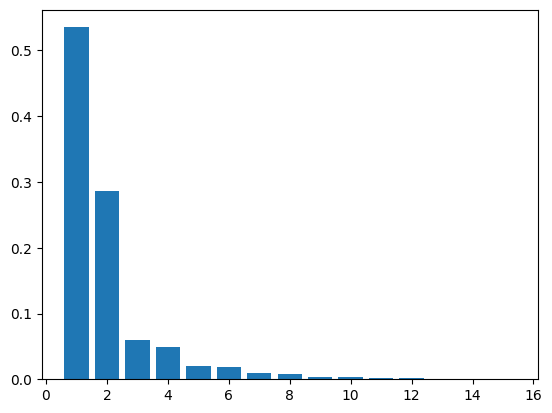

In [61]:
#dimensionality reduction

pca = PCA(n_components=15)
pca.fit(shot_features_df)
plt.bar([n for n in range(1, len(pca.explained_variance_ratio_)+1)], pca.explained_variance_ratio_)

In [62]:
np.set_printoptions(precision=5, suppress=True) 
print('explained variance ratio: {}'.format(pca.explained_variance_ratio_))
print(np.cumsum(pca.explained_variance_ratio_).tolist())

explained variance ratio: [0.5353  0.28603 0.05973 0.04973 0.02074 0.01848 0.00975 0.00744 0.00403
 0.00303 0.00234 0.00161 0.00056 0.00052 0.00051]
[0.5353036792763103, 0.8213337155519744, 0.8810600007186371, 0.9307929344100804, 0.9515332016788133, 0.9700147950948234, 0.9797651384021691, 0.9872025591922895, 0.9912333155386787, 0.9942646583641632, 0.9966050208229799, 0.998219105537212, 0.9987749998172917, 0.9992931828644964, 0.9998036326048692]


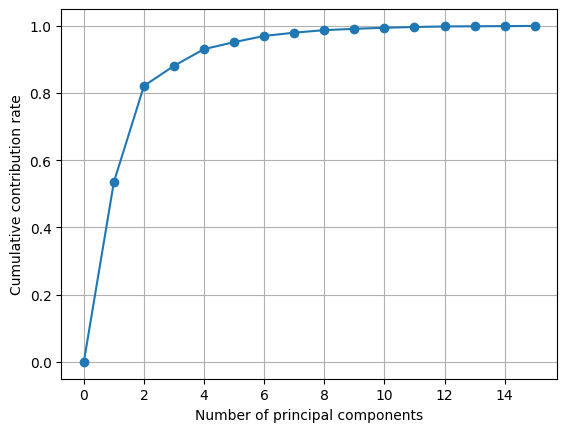

In [63]:
plt.gca().get_xaxis().set_major_locator(ticker.MaxNLocator(integer=True))
plt.plot([0] + list( np.cumsum(pca.explained_variance_ratio_)), "-o")
plt.xlabel("Number of principal components")
plt.ylabel("Cumulative contribution rate")
plt.grid()
plt.show()

In [64]:
n = 9
pca = PCA(n_components=n)
pca_result = pca.fit_transform(shot_features_df)
pca_result.shape

(41160, 9)

In [65]:
pd.DataFrame(pca.components_, columns=shot_features_df.columns[0:], index=["PC{}".format(x + 1) for x in range(n)])

,shot_x,shot_y,shot_before1_x,shot_before1_y,ball_catch_x,ball_catch_y,ball_catch_distance,shot_distance,shot_before0.5_distance,shot_before1_distance,shot_before1.5_distance,shot_before2_distance,shot_before2.5_distance,shot_before3_distance,ball_holding_distance,shot_speed,ball_holding_time
PC1,0.116317,0.002384,0.133494,-0.000839,0.121339,-0.000654,0.365516,0.336611,0.352570,0.360374,0.359356,0.346959,0.326305,0.305510,0.022107,-0.054858,0.002993
PC2,-0.076999,-0.004958,0.000423,-0.002158,0.103001,0.002258,0.173611,-0.366235,-0.306063,-0.167848,0.003943,0.150793,0.241843,0.275217,0.701899,0.147639,0.160829
PC3,-0.098885,-0.014572,-0.036702,-0.012402,-0.086596,-0.018730,-0.321720,-0.294023,-0.221695,-0.099074,0.070741,0.254182,0.388342,0.434667,-0.512003,0.068330,-0.235727
PC4,-0.021976,0.572755,-0.000160,0.591381,-0.005854,0.566511,-0.007621,-0.008819,-0.005741,0.001192,0.007689,0.009712,0.008130,0.007612,-0.012249,0.012637,-0.003362
PC5,-0.591534,-0.013280,-0.603434,-0.005119,-0.467622,-0.004530,0.182718,0.102140,0.090344,0.067433,0.059531,0.051016,0.026194,-0.005111,0.053295,-0.027750,0.008049
PC6,-0.071110,-0.015088,0.113996,-0.005273,-0.077936,-0.002496,-0.149363,-0.344956,-0.001639,0.360087,0.464618,0.244942,-0.151699,-0.443736,0.057746,0.431696,-0.138443
PC7,-0.081706,0.011828,-0.046547,0.004395,0.266620,-0.020505,0.650714,-0.134046,-0.050030,-0.055532,-0.154258,-0.195870,-0.103046,0.041695,-0.230556,0.383508,-0.444698
PC8,0.058290,0.008688,-0.007304,-0.003976,-0.141068,-0.010175,-0.358925,0.347177,0.247963,0.023632,-0.192152,-0.194003,0.040843,0.278461,0.216695,0.670829,-0.119640
PC9,-0.037916,-0.082387,0.031390,-0.015810,0.010866,0.109244,-0.182447,0.039877,0.046654,0.040606,0.017107,-0.018675,-0.027319,0.010857,0.365770,-0.393616,-0.805951


In [66]:
# Visualization of shot distribution by UMAP

reducer = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.1, random_state=24)
fit_ = reducer.fit(pca_result)

In [67]:
umap_embedding = fit_.transform(pca_result)

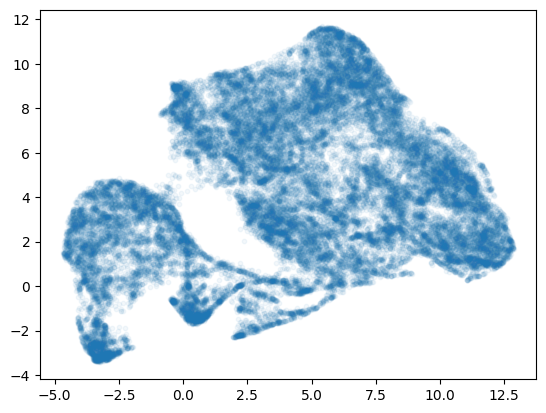

In [68]:
plt.scatter(umap_embedding[:, 0], umap_embedding[:, 1], alpha=0.05, s=10)

In [69]:
data_3 = []

for i in range(len(pca_result)):
    if meta_features_df.loc[i, "point"] == 3:
        data_3.append(pca_result[i, :])

In [70]:
embedding3 = fit_.transform(data_3)

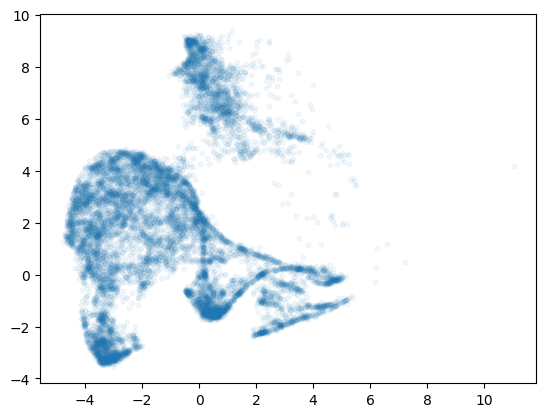

In [71]:
plt.scatter(embedding3[:, 0], embedding3[:, 1], alpha=0.05, s=10)

In [72]:
# Count the number of shots for each player

player_list = collections.Counter(meta_features_df["shooter_name"])
shot_count_by_player = collections.Counter(player_list)
shot_count_by_player

Counter({'Kyle Lowry': 250,
         'Nicolas Batum': 204,
         'DeMar DeRozan': 344,
         'PJ Hairston': 120,
         'Kemba Walker': 286,
         'DeMarre Carroll': 90,
         'Marvin Williams': 152,
         'Jeremy Lamb': 166,
         'Patrick Patterson': 112,
         'Brian Roberts': 36,
         'Frank Kaminsky': 124,
         'Cory Joseph': 133,
         'Luis Scola': 151,
         'Jonas Valanciunas': 75,
         'Terrence Ross': 125,
         'J.J. Barea': 115,
         'Dirk Nowitzki': 262,
         'Deron Williams': 173,
         'Hassan Whiteside': 137,
         'Zaza Pachulia': 108,
         'Wesley Matthews': 193,
         'Chris Bosh': 306,
         'Chandler Parsons': 129,
         'Charlie Villanueva': 88,
         'Goran Dragic': 150,
         'Gerald Green': 139,
         'JaVale McGee': 26,
         'Dwyane Wade': 251,
         'Luol Deng': 118,
         'John Jenkins': 31,
         'Udonis Haslem': 19,
         'Dwight Powell': 77,
         'Pau Gaso

In [73]:
# Players with 30 or more shot data

player_30 = [shooter_name for shooter_name, count in shot_count_by_player.items() if count >= 30]
player_30

['Kyle Lowry',
 'Nicolas Batum',
 'DeMar DeRozan',
 'PJ Hairston',
 'Kemba Walker',
 'DeMarre Carroll',
 'Marvin Williams',
 'Jeremy Lamb',
 'Patrick Patterson',
 'Brian Roberts',
 'Frank Kaminsky',
 'Cory Joseph',
 'Luis Scola',
 'Jonas Valanciunas',
 'Terrence Ross',
 'J.J. Barea',
 'Dirk Nowitzki',
 'Deron Williams',
 'Hassan Whiteside',
 'Zaza Pachulia',
 'Wesley Matthews',
 'Chris Bosh',
 'Chandler Parsons',
 'Charlie Villanueva',
 'Goran Dragic',
 'Gerald Green',
 'Dwyane Wade',
 'Luol Deng',
 'John Jenkins',
 'Dwight Powell',
 'Pau Gasol',
 'Jimmy Butler',
 'Taj Gibson',
 'Robin Lopez',
 'Kristaps Porzingis',
 'Carmelo Anthony',
 'Nikola Mirotic',
 'Lance Thomas',
 'Jose Calderon',
 'Arron Afflalo',
 'Bobby Portis',
 'Tony Snell',
 "Kyle O'Quinn",
 'Aaron Brooks',
 'Derrick Williams',
 'Langston Galloway',
 'Kevin Seraphin',
 "E'Twaun Moore",
 'Doug McDermott',
 'Marcin Gortat',
 'Nikola Vucevic',
 'Elfrid Payton',
 'Garrett Temple',
 'John Wall',
 'Evan Fournier',
 'Jared Dudle

In [74]:
# Organize the shots by player 

shot_by_player = {}
for player in collections.Counter.keys(shot_count_by_player):
    shot_stack = []
    print(player)
    for i in range(len(meta_features_df)):
        if player == meta_features_df.loc[i, "shooter_name"]:
            shot_stack.append(pca_result[i])
    shot_by_player[player] = shot_stack
shot_by_player

Kyle Lowry
Nicolas Batum
DeMar DeRozan
PJ Hairston
Kemba Walker
DeMarre Carroll
Marvin Williams
Jeremy Lamb
Patrick Patterson
Brian Roberts


Frank Kaminsky
Cory Joseph
Luis Scola
Jonas Valanciunas
Terrence Ross
J.J. Barea
Dirk Nowitzki
Deron Williams
Hassan Whiteside
Zaza Pachulia
Wesley Matthews
Chris Bosh
Chandler Parsons
Charlie Villanueva
Goran Dragic
Gerald Green
JaVale McGee
Dwyane Wade
Luol Deng
John Jenkins
Udonis Haslem
Dwight Powell
Pau Gasol
Jimmy Butler
Taj Gibson
Robin Lopez
Kristaps Porzingis
Carmelo Anthony
Nikola Mirotic
Lance Thomas
Jose Calderon
Arron Afflalo
Bobby Portis
Tony Snell
Kyle O'Quinn
Aaron Brooks
Derrick Williams
Langston Galloway
Kevin Seraphin
E'Twaun Moore
Doug McDermott
Marcin Gortat
Nikola Vucevic
Elfrid Payton
Garrett Temple
John Wall
Evan Fournier
Jared Dudley
Channing Frye
Ramon Sessions
Jason Smith
Otto Porter Jr.
Kris Humphries
Aaron Gordon
Andrew Nicholson
Kelly Oubre Jr.
Tobias Harris
Victor Oladipo
Drew Gooden
Mario Hezonja
Dewayne Dedmon
Lou Williams
Roy Hibbert
Jordan Clarkson
Isaiah Canaan
Anthony Brown
D'Angelo Russell
Ish Smith
Julius Randle
Nik Stauskas
T.J. McConnell
Jahlil 

{'Kyle Lowry': [array([-0.13159, -0.52409,  0.90333,  0.0052 , -1.17474, -0.23132,
         -0.14073,  0.2372 , -0.01258]),
  array([ 3.30334, -3.10433,  0.16716, -2.97127,  1.35578, -0.23124,
         -0.1573 ,  0.26725,  0.37523]),
  array([-0.52989, -6.98024, -4.9696 , -2.93692,  0.24058,  1.92312,
          1.45489, -1.08993,  0.1236 ]),
  array([ 3.00705, -1.87369, -2.49059, -2.37818, -0.06917,  0.6813 ,
         -2.30455,  1.00928,  0.13011]),
  array([ 0.71733, 12.39824, -0.69072, -0.36591,  0.59814,  0.36392,
          1.21468,  0.26877,  0.52714]),
  array([-1.0578 ,  6.74461, -0.4938 ,  0.24656, -0.22247,  1.4774 ,
          0.17778,  0.07613, -0.17357]),
  array([-2.02008,  2.03123, -1.67136, -1.84569,  0.04465, -2.20461,
          0.61922,  1.25221, -0.61903]),
  array([ 2.64993,  0.88251, -1.66008, -2.24063,  0.43181,  0.33283,
         -1.41579,  0.85256,  0.71836]),
  array([-0.95954,  6.39993, -1.98612, -1.61075,  0.81938, -3.42493,
          0.92286,  0.80421,  0.53789

In [75]:
# Limited to players with 30 or more shot data

pca_result_30 = {name: np.array(shot_by_player[name]) for name in player_30 if name in shot_by_player.keys()}
pca_result_30

{'Kyle Lowry': array([[-0.13159, -0.52409,  0.90333, ..., -0.14073,  0.2372 , -0.01258],
        [ 3.30334, -3.10433,  0.16716, ..., -0.1573 ,  0.26725,  0.37523],
        [-0.52989, -6.98024, -4.9696 , ...,  1.45489, -1.08993,  0.1236 ],
        ...,
        [ 9.76669,  2.15626, -0.60576, ..., -0.55326,  0.17896, -0.29915],
        [ 6.80239,  3.66954, -1.11268, ..., -0.127  ,  0.26981, -0.07379],
        [ 1.82476, 12.14075, -1.45843, ...,  0.99055,  1.24943,  0.63708]]),
 'Nicolas Batum': array([[-1.95   , -0.98202, -0.91976, ..., -0.67905,  0.98504, -0.56274],
        [-1.82188,  2.93454, -1.49566, ..., -0.71542,  0.61327, -0.13191],
        [ 1.16591, -3.59716, -1.60318, ...,  0.30535,  0.7082 ,  0.54897],
        ...,
        [ 5.41491, -3.56601,  0.95547, ...,  0.32012, -0.21927,  0.02954],
        [ 3.61315, -2.06216, -0.53677, ..., -0.07012,  0.53267,  0.53888],
        [ 3.87653, -2.10681, -0.39004, ...,  0.00762,  0.60902,  0.43359]]),
 'DeMar DeRozan': array([[ 3.41577, -3.

In [76]:
# Save to pickle file

with open('../pickle_files/shot_data.pkl', 'wb') as f:
    pickle.dump(shot_count_by_player, f)
    pickle.dump(shot_features_df, f)
    pickle.dump(meta_features_df, f)
    pickle.dump(pca_result, f)
    pickle.dump(player_30, f)
    pickle.dump(pca_result_30, f)

In [77]:
with open('../pickle_files/shot_data.pkl', 'rb') as f:
    shot_count_by_player = pickle.load(f)
    shot_features_df = pickle.load(f)
    meta_features_df = pickle.load(f)
    pca_result = pickle.load(f)
    player_30 = pickle.load(f)
    pca_result_30 = pickle.load(f)

In [78]:
# Calculate Earth Mover's Distance Matrix

condensed_distance_matrix = []
for shooter_name_r, embedding_r in pca_result_30.items():
    m = len(embedding_r)
    flag = 0
    for shooter_name_c, embedding_c in pca_result_30.items():
        if flag == 0 and shooter_name_r != shooter_name_c:
            continue
        elif shooter_name_r == shooter_name_c:
            flag = 1
            continue            
        else:
            n = len(embedding_c)
            a = np.ones(m)/m
            b = np.ones(n)/n
            C = np.linalg.norm(embedding_c[np.newaxis] - embedding_r[:, np.newaxis], axis=2)
            P = ot.emd(a, b, C)
            OT = C*P
            EMD = OT.sum()
            condensed_distance_matrix.append(EMD)
condensed_distance_matrix

[3.858005483479425,
 4.478623341323705,
 5.1473650692962565,
 2.9867477491553847,
 4.335787959878791,
 5.395537144339537,
 3.803196485582203,
 5.318298814028031,
 4.276854667477192,
 5.0859610496617895,
 4.227056450410585,
 6.933070976995851,
 11.639791756810652,
 5.210016514568153,
 2.968806832811681,
 7.294819047789196,
 3.59672288727839,
 12.831542630721765,
 10.635483496531688,
 4.9873641609300305,
 6.211228987178397,
 3.9784224051898374,
 5.102811534408912,
 3.510528204322014,
 4.2410782747389595,
 5.510995403446539,
 5.278217657717322,
 4.99600805430785,
 7.530922463573374,
 8.036413078325289,
 3.899556843006768,
 10.580002015583396,
 11.560642894982847,
 6.373200109087151,
 5.948503831648213,
 5.3131850715103885,
 5.565498396920416,
 4.280529391492207,
 5.558343759857583,
 6.006835287940422,
 4.60262021437353,
 7.920980160134383,
 4.186888062145996,
 6.142632261998113,
 4.167765043881092,
 9.709080989513271,
 4.812748495414601,
 4.53061649215513,
 10.956920731106921,
 8.97141878

In [79]:
condensed_distance_matrix = np.array(condensed_distance_matrix)
condensed_distance_matrix

array([3.85801, 4.47862, 5.14737, ..., 8.05887, 6.84151, 8.9448 ])

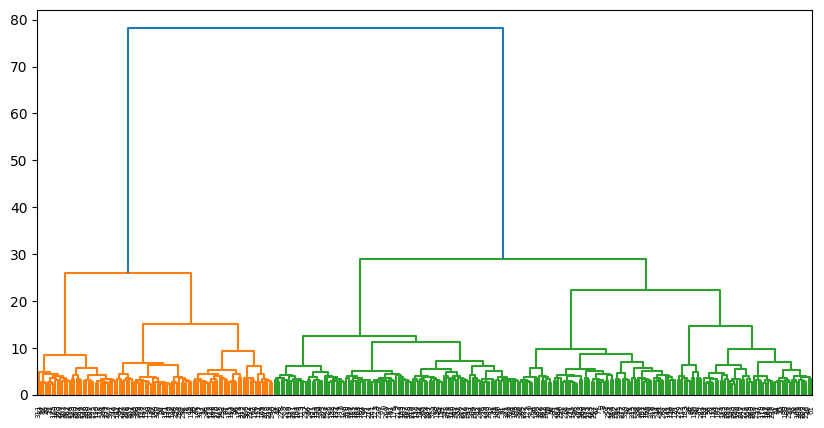

In [80]:
# Drawing dendrograms

Z = linkage(condensed_distance_matrix, method="ward")
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.show()

In [81]:
distance_matrix = squareform(condensed_distance_matrix)

In [82]:
# Calculation of silhouette coefficient

silhouette_scores = []
for k in range(2,21):
    cluster_label = fcluster(Z, t=k, criterion="maxclust")
    silhouette_scores.append(silhouette_score(distance_matrix, cluster_label, metric="precomputed"))
silhouette_scores

[0.3968909709074737,
 0.20448701143476297,
 0.15859820000826338,
 0.14855078067328029,
 0.12874820668006784,
 0.12070518411297804,
 0.08389085903267712,
 0.08275820916756618,
 0.07932406648076498,
 0.07806406568662186,
 0.08077689845010981,
 0.08325782315371223,
 0.07465628577550122,
 0.07129291149462255,
 0.07096269626109956,
 0.0671081744964091,
 0.06715601943572878,
 0.06634586611802543,
 0.06026827493580721]

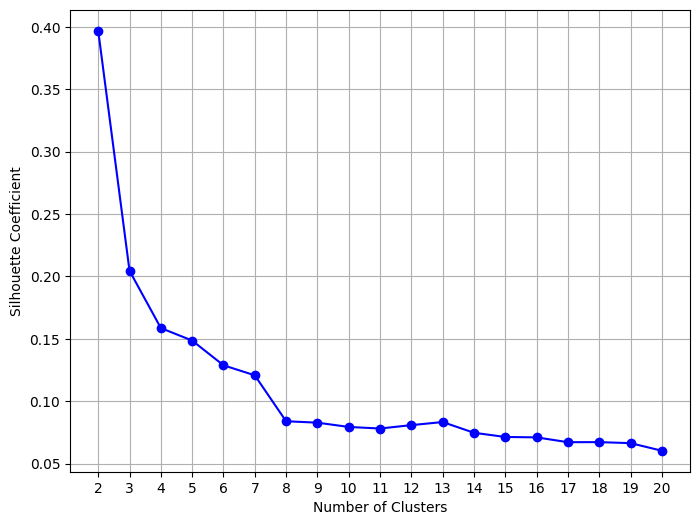

In [83]:
plt.figure(figsize=(8, 6))
plt.plot(range(2, 21), silhouette_scores, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Coefficient')
plt.grid(True)
plt.xticks(np.arange(2, 21, step=1))
plt.show()

In [84]:
# Result of setting the number of clusters to 13

clustering_result = fcluster(Z, t=13, criterion="maxclust")
clustering_result

array([ 6,  5, 11,  9,  6,  5,  8,  5,  9,  6, 13,  7,  3,  1, 10,  7,  3,
        5,  1,  2, 12, 13,  5, 12,  7,  5, 11, 12, 10,  3,  2,  7,  2,  1,
       13, 13,  8, 13, 10, 13, 13,  9,  3,  7, 13, 10,  2,  7, 10,  1,  2,
        7,  9,  6,  5,  8,  8,  7,  3, 12,  8, 13,  4,  9, 12,  7,  5,  6,
        2,  7, 10,  9,  6,  7,  4, 10,  7,  1,  2, 11, 11, 10,  2,  1,  2,
        7,  9, 10,  3,  9,  5,  3,  6, 13,  2,  9,  3, 11, 11,  1,  1, 10,
       12,  6,  5, 13,  5,  1,  6,  5,  5,  3,  3, 12, 12,  6,  7,  4, 13,
        5,  1,  5,  8,  6,  2,  5,  8, 10,  2,  1,  7,  5,  7,  1, 11,  9,
       10,  2,  4,  2,  7, 10,  2,  9,  7,  9,  1, 13,  2,  5, 11,  2,  5,
        5,  7, 13, 12,  6,  7,  2,  7,  6,  9,  1,  9,  3, 13,  6,  3,  4,
        2, 10,  1,  2,  3,  1,  6,  5,  3, 13,  8,  6, 12, 11,  9, 10,  7,
        6,  6, 13, 12,  3,  2,  3,  5,  7,  7, 12,  2,  6,  7,  9, 10, 13,
        7,  5,  7,  6,  8,  1,  9,  6,  9,  6,  9, 10,  7,  7, 10,  6,  1,
        1,  8,  5,  4, 12

In [85]:
# Number of players in each cluster

cluster_count = collections.Counter(clustering_result)
cluster_count

Counter({6: 28,
         5: 30,
         11: 11,
         9: 26,
         8: 14,
         13: 25,
         7: 45,
         3: 21,
         1: 33,
         10: 26,
         2: 32,
         12: 21,
         4: 13})

In [86]:
# Correspondence between players and clusters

player_cluster_dict ={}
for i, player in enumerate(pca_result_30.keys()):
    player_cluster_dict[player] = clustering_result[i]
player_cluster_dict

{'Kyle Lowry': 6,
 'Nicolas Batum': 5,
 'DeMar DeRozan': 11,
 'PJ Hairston': 9,
 'Kemba Walker': 6,
 'DeMarre Carroll': 5,
 'Marvin Williams': 8,
 'Jeremy Lamb': 5,
 'Patrick Patterson': 9,
 'Brian Roberts': 6,
 'Frank Kaminsky': 13,
 'Cory Joseph': 7,
 'Luis Scola': 3,
 'Jonas Valanciunas': 1,
 'Terrence Ross': 10,
 'J.J. Barea': 7,
 'Dirk Nowitzki': 3,
 'Deron Williams': 5,
 'Hassan Whiteside': 1,
 'Zaza Pachulia': 2,
 'Wesley Matthews': 12,
 'Chris Bosh': 13,
 'Chandler Parsons': 5,
 'Charlie Villanueva': 12,
 'Goran Dragic': 7,
 'Gerald Green': 5,
 'Dwyane Wade': 11,
 'Luol Deng': 12,
 'John Jenkins': 10,
 'Dwight Powell': 3,
 'Pau Gasol': 2,
 'Jimmy Butler': 7,
 'Taj Gibson': 2,
 'Robin Lopez': 1,
 'Kristaps Porzingis': 13,
 'Carmelo Anthony': 13,
 'Nikola Mirotic': 8,
 'Lance Thomas': 13,
 'Jose Calderon': 10,
 'Arron Afflalo': 13,
 'Bobby Portis': 13,
 'Tony Snell': 9,
 "Kyle O'Quinn": 3,
 'Aaron Brooks': 7,
 'Derrick Williams': 13,
 'Langston Galloway': 10,
 'Kevin Seraphin': 2

In [102]:
# Organize players by clusters

players_grouped_by_cluster_dict = defaultdict(list)
for key, value in player_cluster_dict.items():
    players_grouped_by_cluster_dict[value].append(key)
players_grouped_by_cluster_dict[1]

['Jonas Valanciunas',
 'Hassan Whiteside',
 'Robin Lopez',
 'Marcin Gortat',
 'Jahlil Okafor',
 'Thaddeus Young',
 'David Lee',
 'Willie Reed',
 'Kenneth Faried',
 'Andre Drummond',
 'Aron Baynes',
 'Dwight Howard',
 'Clint Capela',
 'Jeff Withey',
 'John Henson',
 'Greg Monroe',
 'Timofey Mozgov',
 'Cole Aldrich',
 'DeAndre Jordan',
 'Willie Cauley-Stein',
 'Bismack Biyombo',
 'Tyson Chandler',
 'Andrew Bogut',
 'Mason Plumlee',
 'Steven Adams',
 'Kosta Koufos',
 'Tristan Thompson',
 'Thomas Robinson',
 'Rudy Gobert',
 'Ed Davis',
 'Festus Ezeli',
 'Tiago Splitter',
 'Joakim Noah']

In [88]:
with open('../pickle_files/clustering1.pkl', 'wb') as f:
    pickle.dump(clustering_result, f)
    pickle.dump(player_cluster_dict, f)
    pickle.dump(players_grouped_by_cluster_dict, f)

In [89]:
shots_by_cluster = {}
for n, cluster in players_grouped_by_cluster_dict.items():
    indices = []
    for i in range(len(meta_features_df)):
        if meta_features_df.iloc[i, 4] in cluster:
            indices.append(i)
        shots_by_cluster[n] = shot_features_df.iloc[indices, :]

In [90]:
bin_edges = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14]

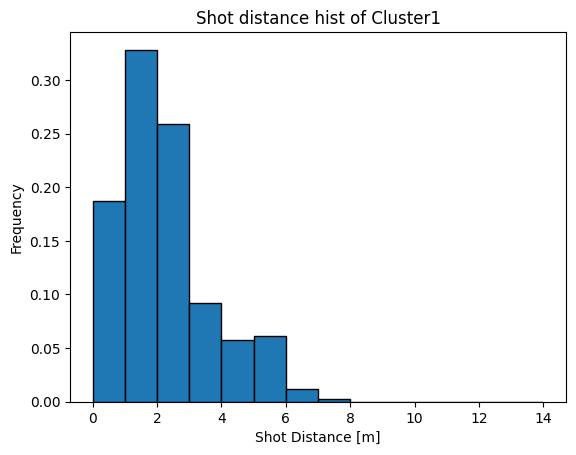

<Figure size 640x480 with 0 Axes>

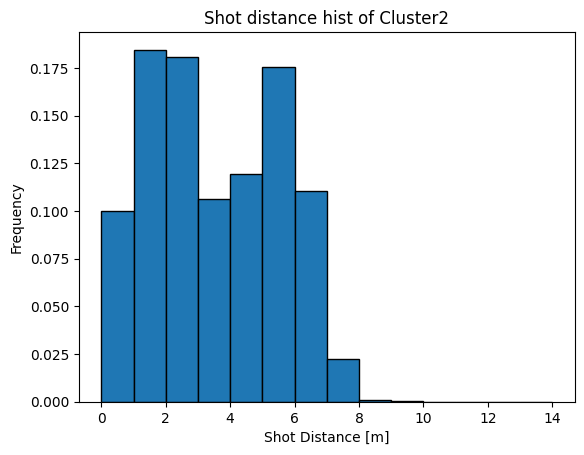

<Figure size 640x480 with 0 Axes>

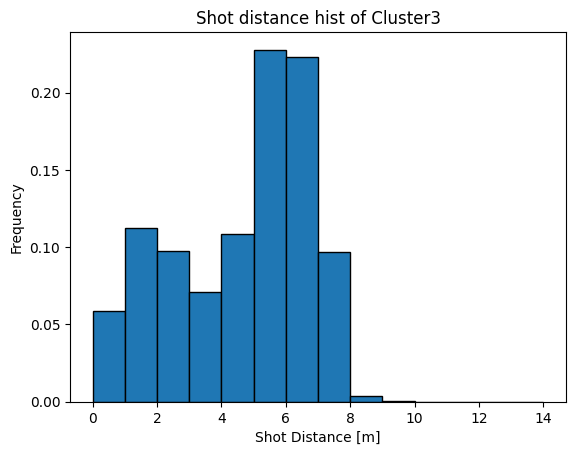

<Figure size 640x480 with 0 Axes>

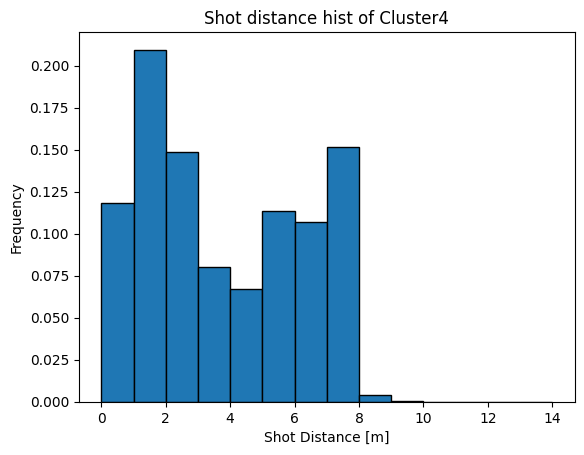

<Figure size 640x480 with 0 Axes>

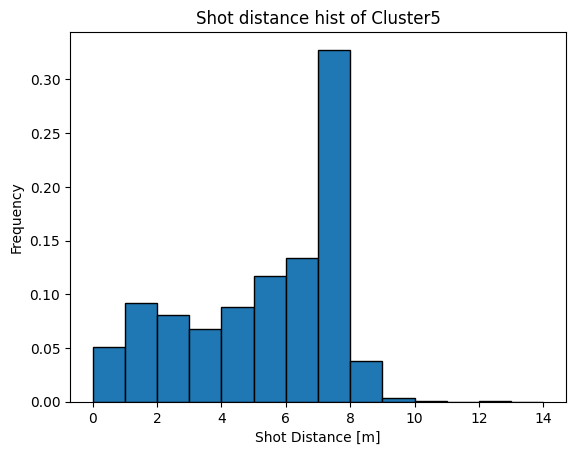

<Figure size 640x480 with 0 Axes>

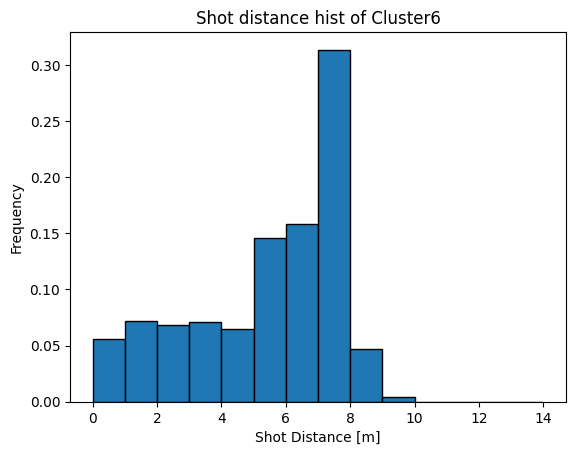

<Figure size 640x480 with 0 Axes>

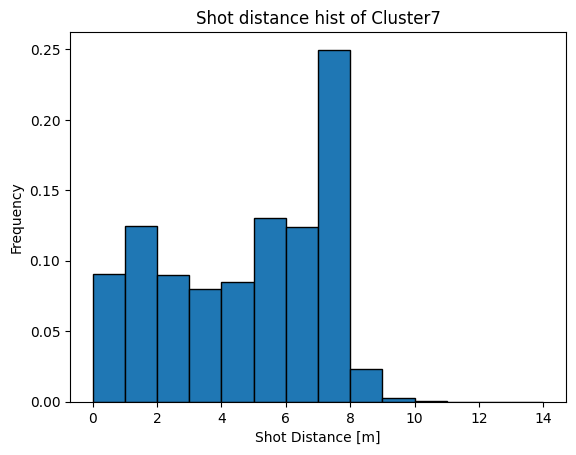

<Figure size 640x480 with 0 Axes>

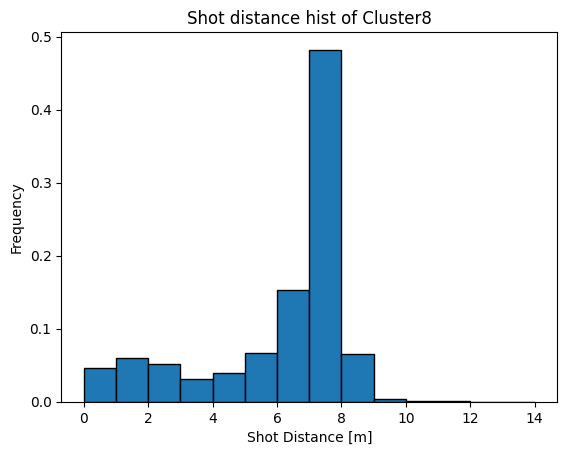

<Figure size 640x480 with 0 Axes>

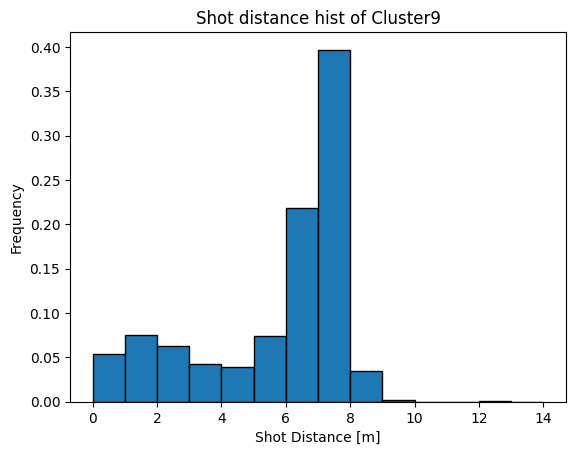

<Figure size 640x480 with 0 Axes>

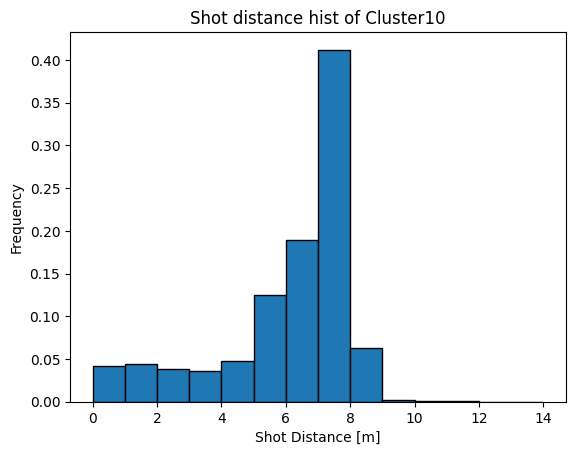

<Figure size 640x480 with 0 Axes>

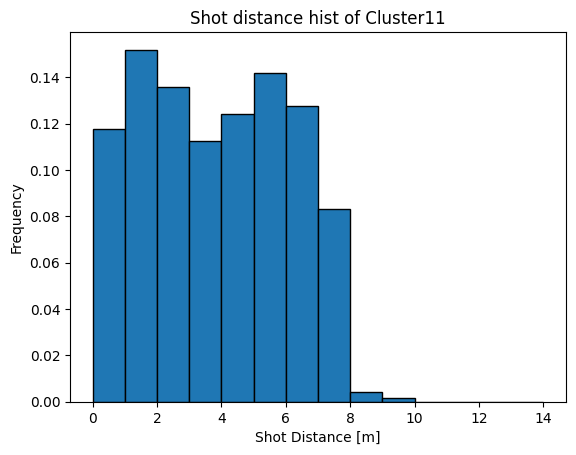

<Figure size 640x480 with 0 Axes>

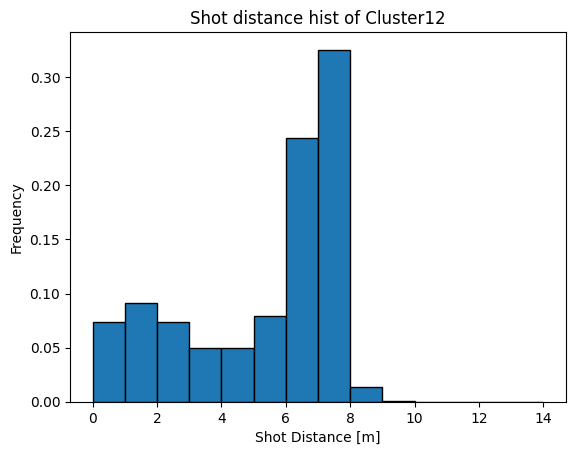

<Figure size 640x480 with 0 Axes>

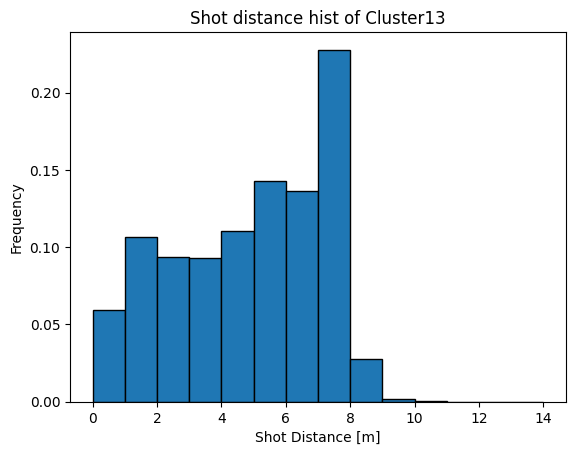

<Figure size 640x480 with 0 Axes>

In [91]:
for i in range(13):          
    n_cluster = i+1
    fig, ax = plt.subplots()
    ax.hist(shots_by_cluster[n_cluster]['shot_distance'], 
            bins = bin_edges, edgecolor='black', 
            weights=np.ones(len(shots_by_cluster[n_cluster]['shot_distance'])) / len(shots_by_cluster[n_cluster]['shot_distance']))
    plt.title('Shot distance hist of Cluster'+str(n_cluster))
    plt.xlabel('Shot Distance [m]')
    plt.ylabel('Frequency')
    plt.show()
    plt.clf()

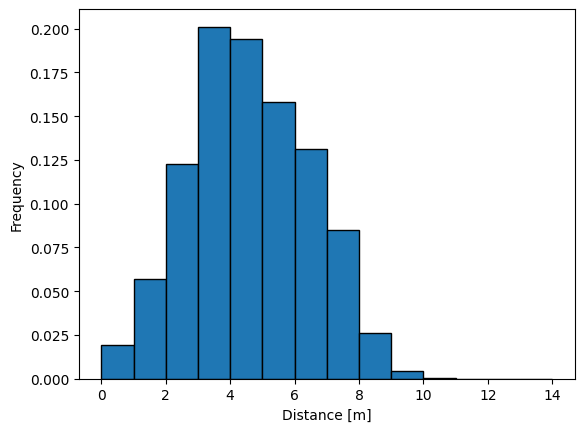

<Figure size 640x480 with 0 Axes>

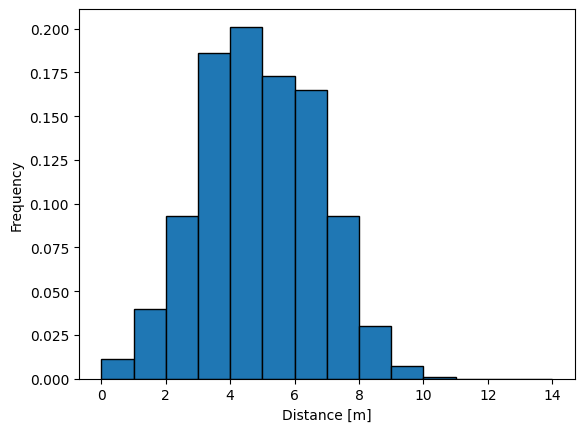

<Figure size 640x480 with 0 Axes>

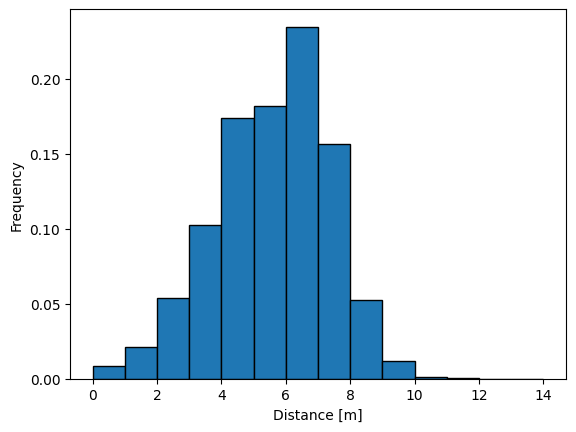

<Figure size 640x480 with 0 Axes>

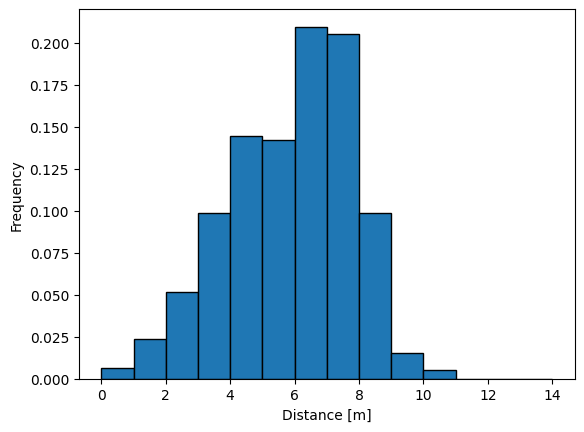

<Figure size 640x480 with 0 Axes>

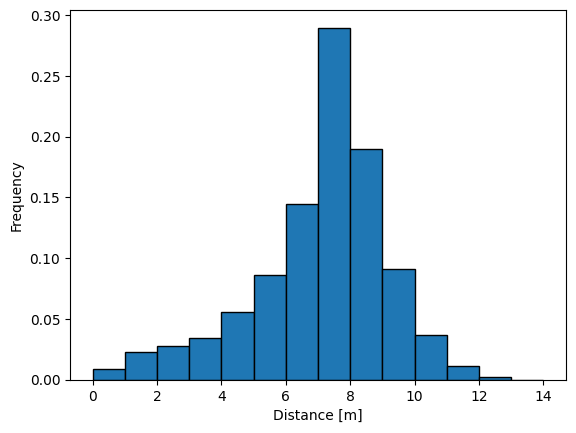

<Figure size 640x480 with 0 Axes>

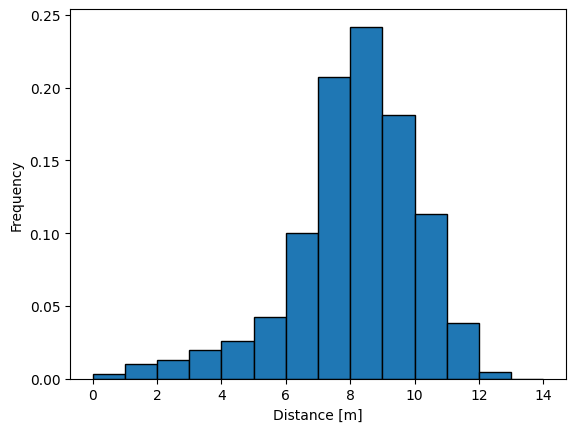

<Figure size 640x480 with 0 Axes>

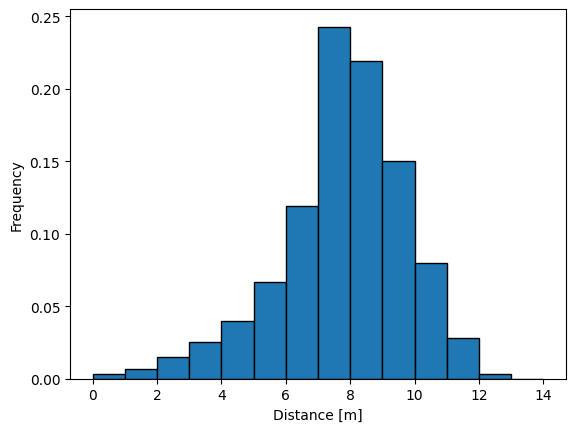

<Figure size 640x480 with 0 Axes>

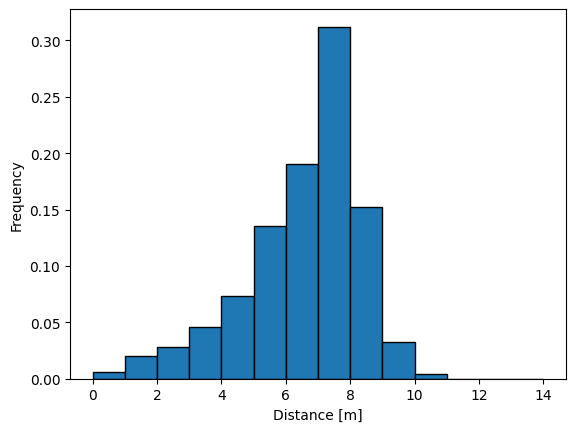

<Figure size 640x480 with 0 Axes>

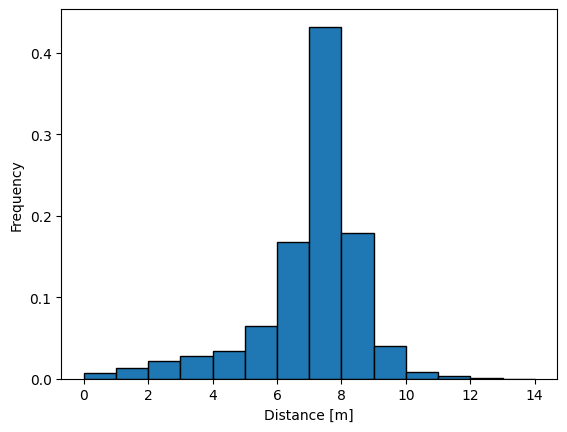

<Figure size 640x480 with 0 Axes>

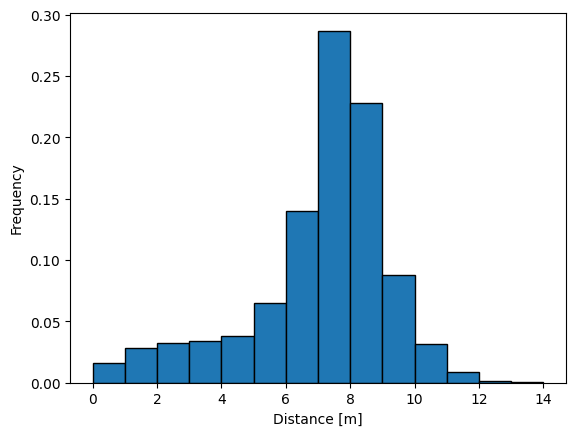

<Figure size 640x480 with 0 Axes>

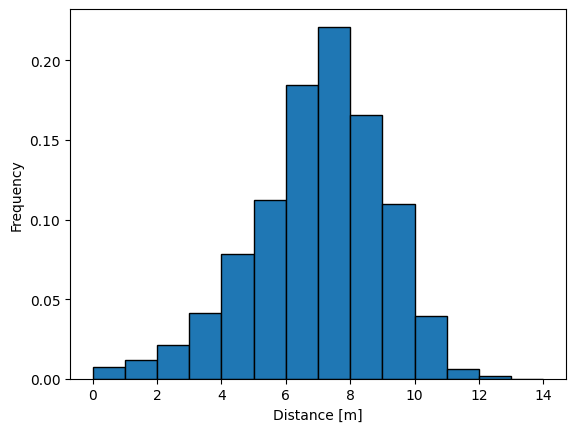

<Figure size 640x480 with 0 Axes>

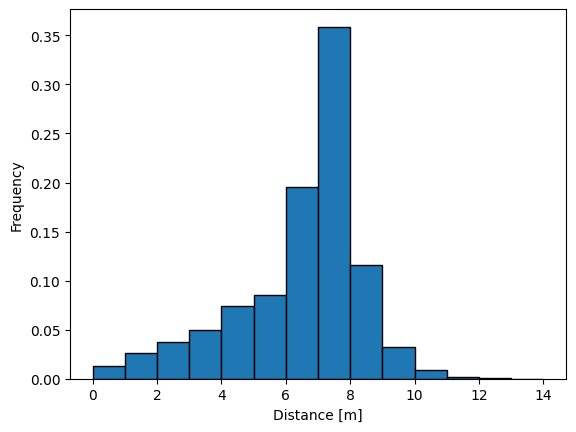

<Figure size 640x480 with 0 Axes>

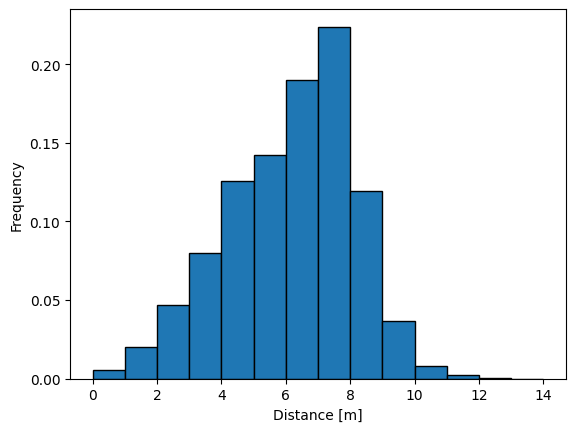

<Figure size 640x480 with 0 Axes>

In [92]:
for i in range(13):          
    n_cluster = i+1
    fig, ax = plt.subplots()
    ax.hist(shots_by_cluster[n_cluster]['shot_before3_distance'], 
            bins = bin_edges, edgecolor='black', 
            weights=np.ones(len(shots_by_cluster[n_cluster]['shot_before3_distance'])) / len(shots_by_cluster[n_cluster]['shot_before3_distance']))
    plt.xlabel('Distance [m]')
    plt.ylabel('Frequency')
    plt.show()
    plt.clf()

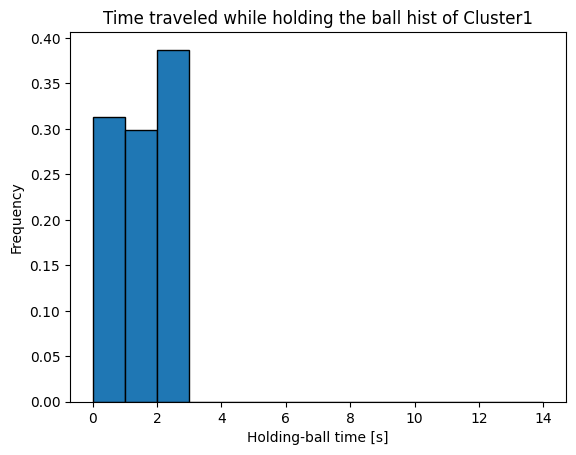

<Figure size 640x480 with 0 Axes>

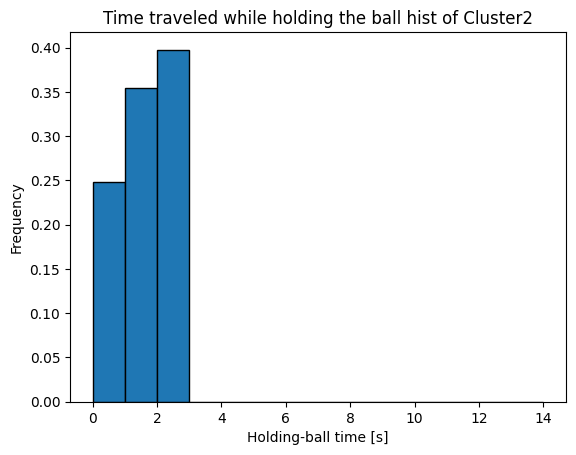

<Figure size 640x480 with 0 Axes>

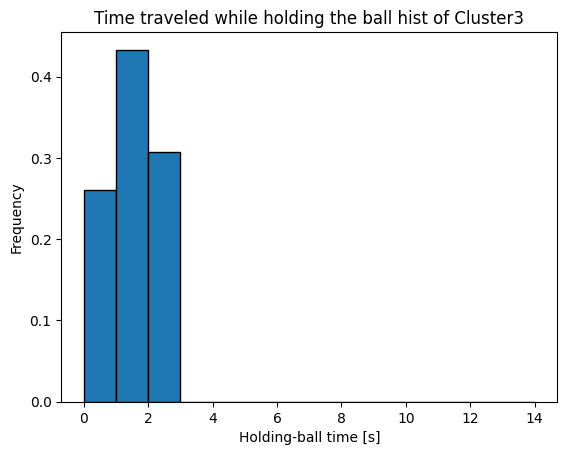

<Figure size 640x480 with 0 Axes>

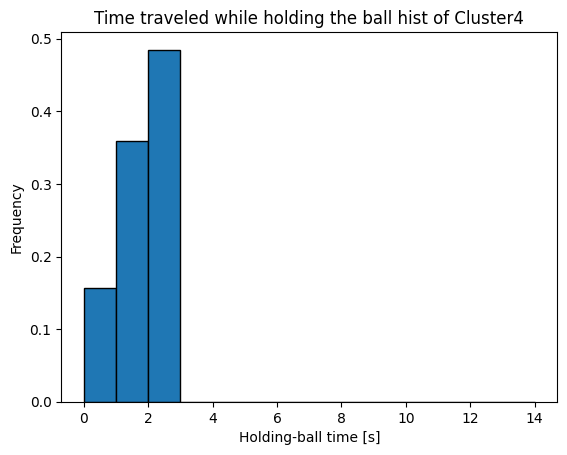

<Figure size 640x480 with 0 Axes>

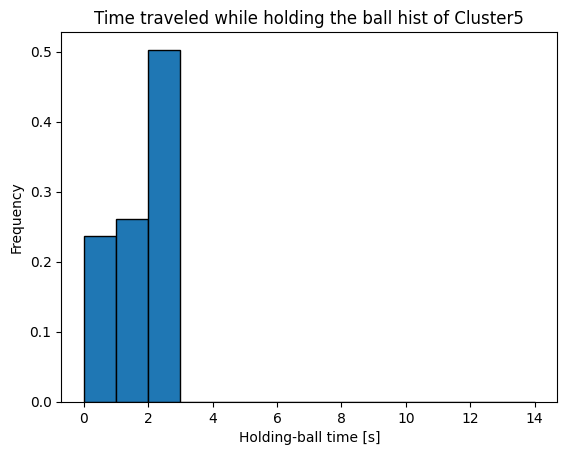

<Figure size 640x480 with 0 Axes>

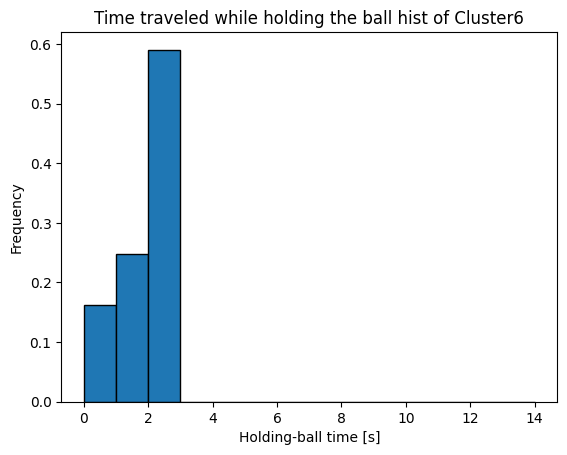

<Figure size 640x480 with 0 Axes>

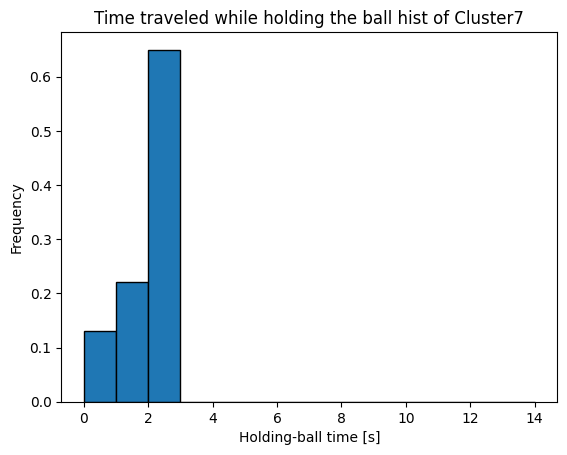

<Figure size 640x480 with 0 Axes>

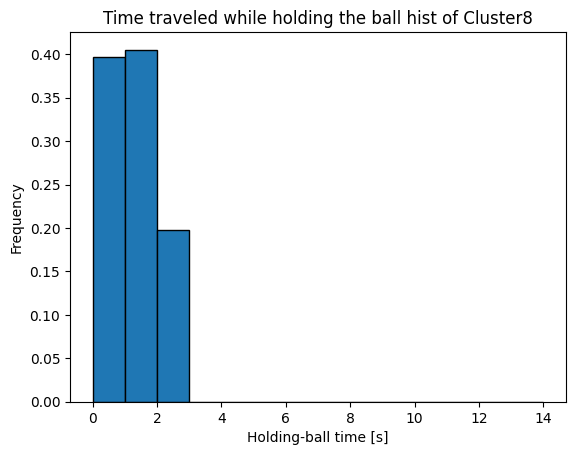

<Figure size 640x480 with 0 Axes>

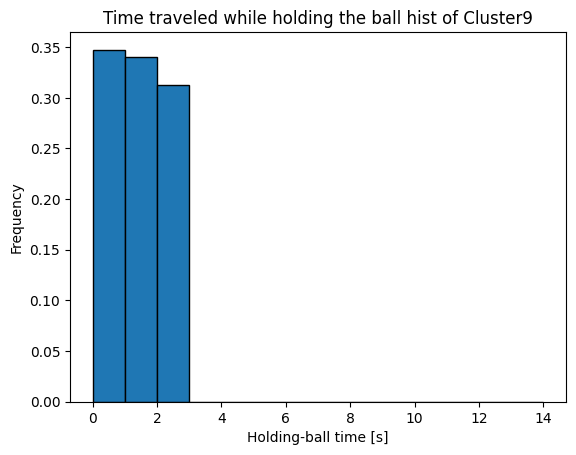

<Figure size 640x480 with 0 Axes>

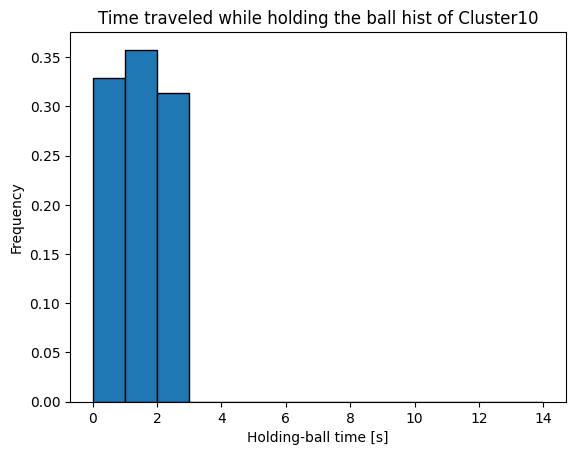

<Figure size 640x480 with 0 Axes>

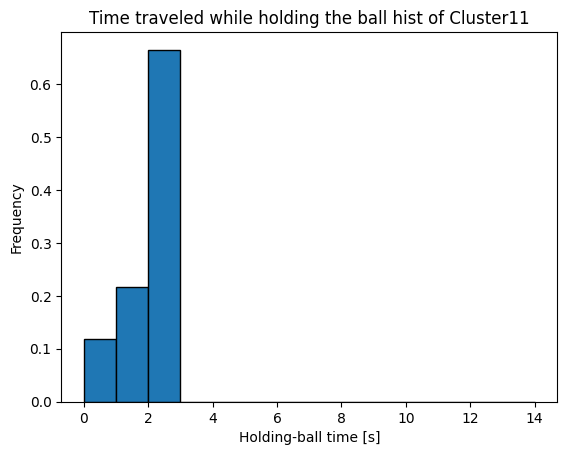

<Figure size 640x480 with 0 Axes>

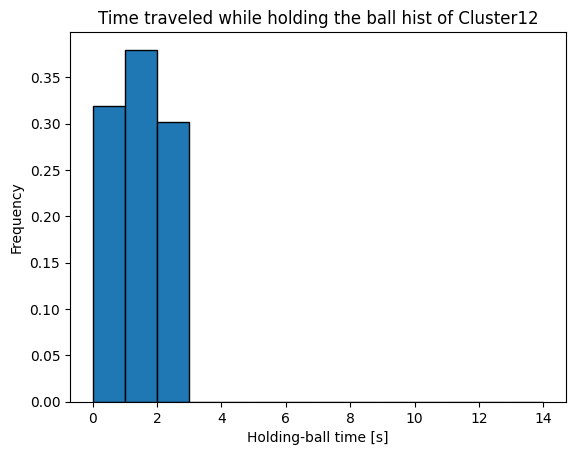

<Figure size 640x480 with 0 Axes>

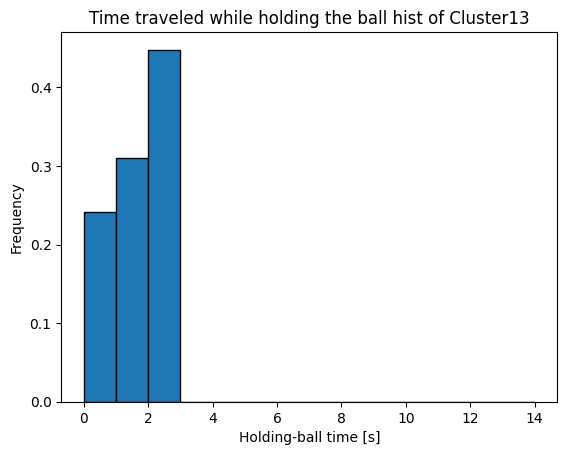

<Figure size 640x480 with 0 Axes>

In [93]:
for i in range(13):          
    n_cluster = i+1
    fig, ax = plt.subplots()
    ax.hist(shots_by_cluster[n_cluster]['ball_holding_time'], 
            bins = bin_edges, edgecolor='black', 
            weights=np.ones(len(shots_by_cluster[n_cluster]['ball_holding_time'])) / len(shots_by_cluster[n_cluster]['ball_holding_time']))
    plt.title('Time traveled while holding the ball hist of Cluster'+str(n_cluster))
    plt.xlabel('Holding-ball time [s]')
    plt.ylabel('Frequency')
    plt.show()
    plt.clf()

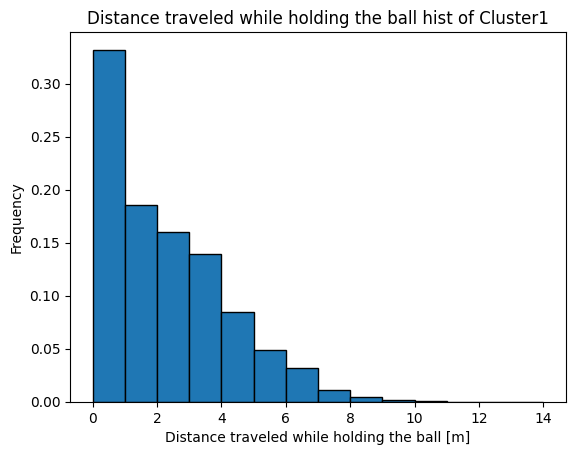

<Figure size 640x480 with 0 Axes>

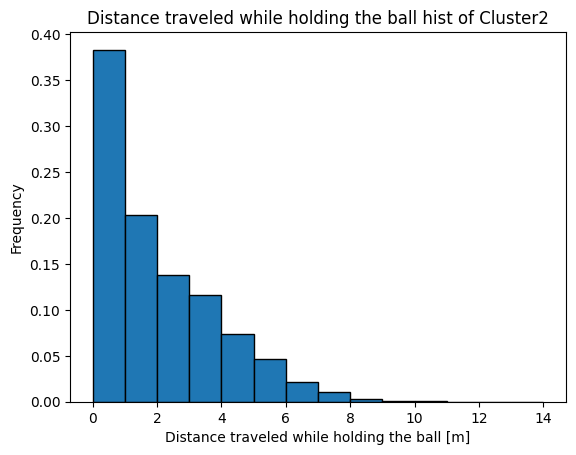

<Figure size 640x480 with 0 Axes>

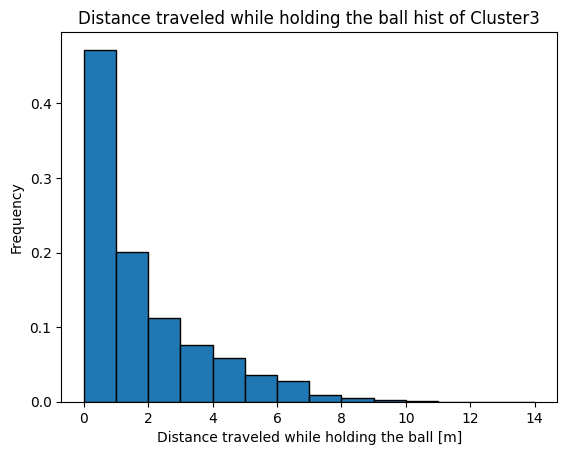

<Figure size 640x480 with 0 Axes>

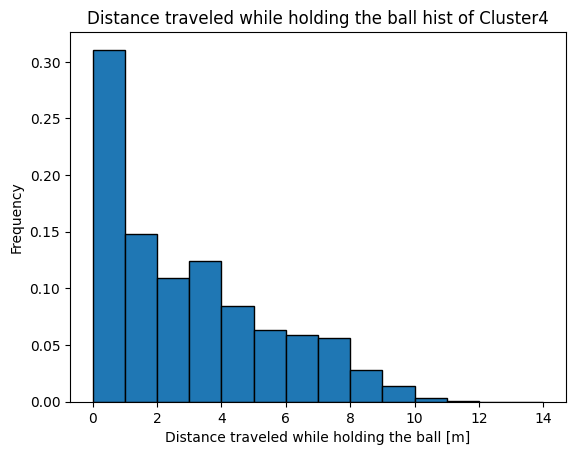

<Figure size 640x480 with 0 Axes>

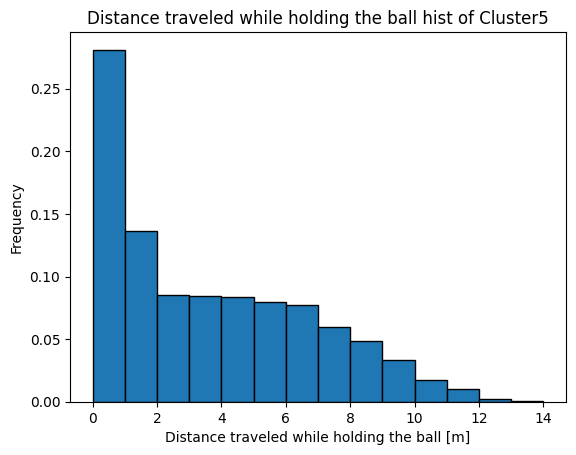

<Figure size 640x480 with 0 Axes>

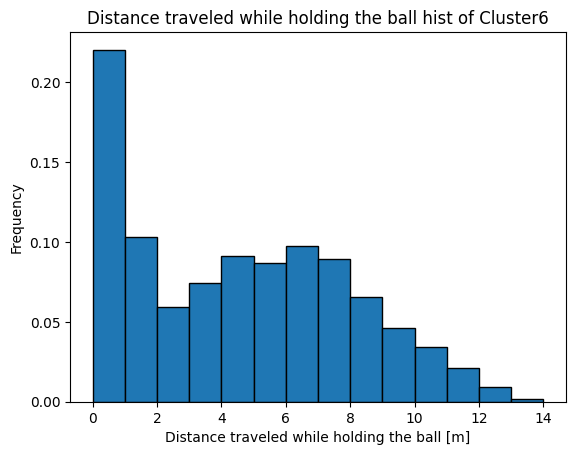

<Figure size 640x480 with 0 Axes>

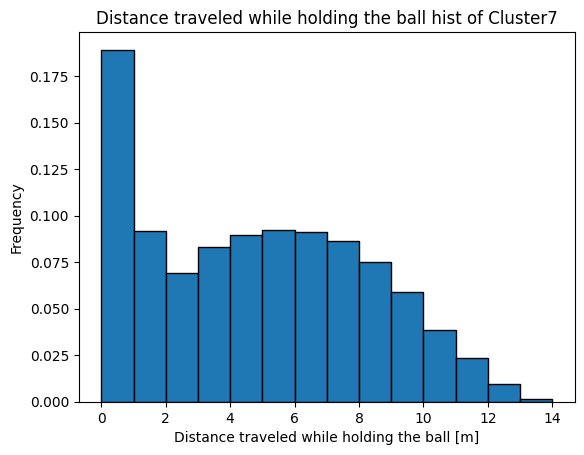

<Figure size 640x480 with 0 Axes>

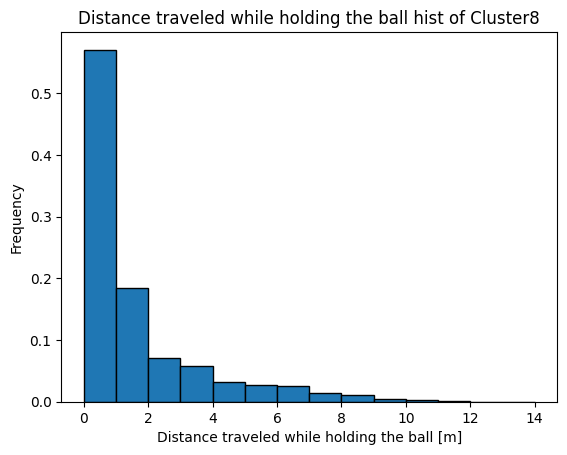

<Figure size 640x480 with 0 Axes>

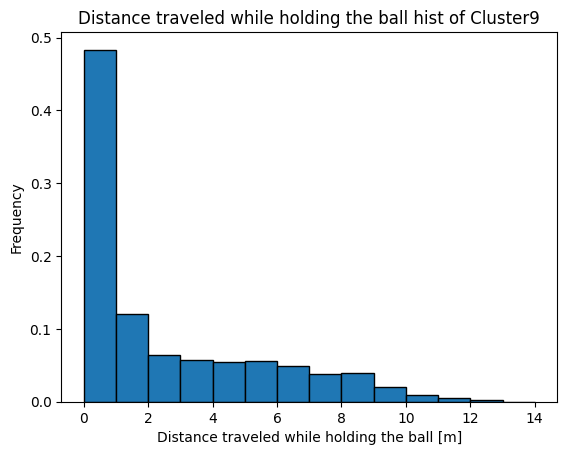

<Figure size 640x480 with 0 Axes>

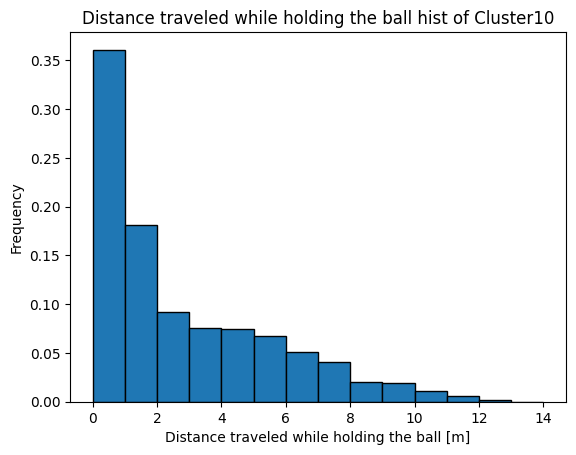

<Figure size 640x480 with 0 Axes>

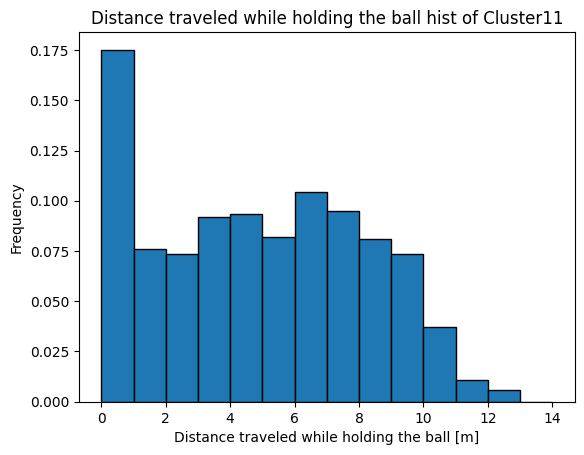

<Figure size 640x480 with 0 Axes>

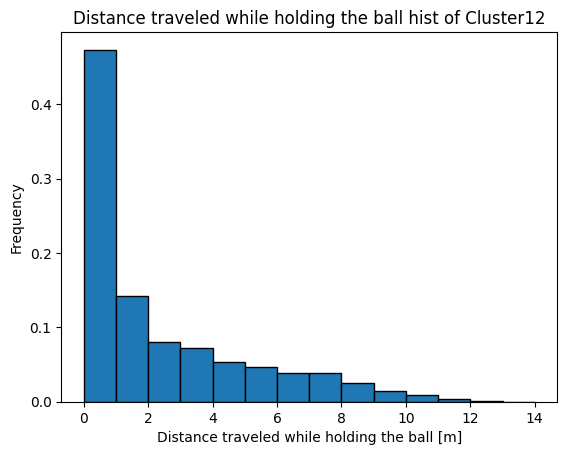

<Figure size 640x480 with 0 Axes>

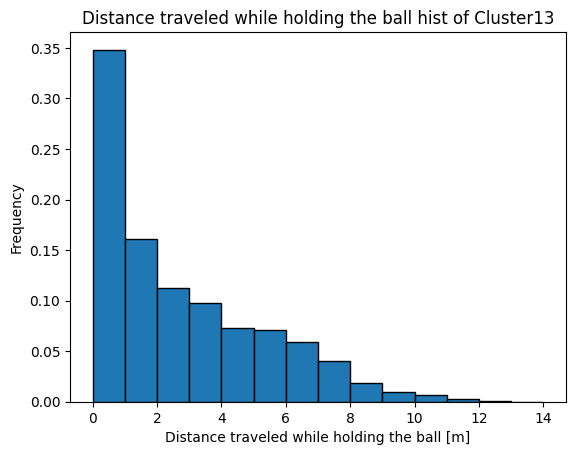

<Figure size 640x480 with 0 Axes>

In [94]:
for i in range(13):          
    n_cluster = i+1
    fig, ax = plt.subplots()
    plt.hist(shots_by_cluster[n_cluster]['ball_holding_distance'], 
             bins=bin_edges, edgecolor='black', 
             weights=np.ones(len(shots_by_cluster[n_cluster]['ball_holding_distance'])) / len(shots_by_cluster[n_cluster]['ball_holding_distance']))
    plt.title('Distance traveled while holding the ball hist of Cluster'+str(n_cluster))
    plt.xlabel('Distance traveled while holding the ball [m]')
    plt.ylabel('Frequency')
    plt.show()
    plt.clf()

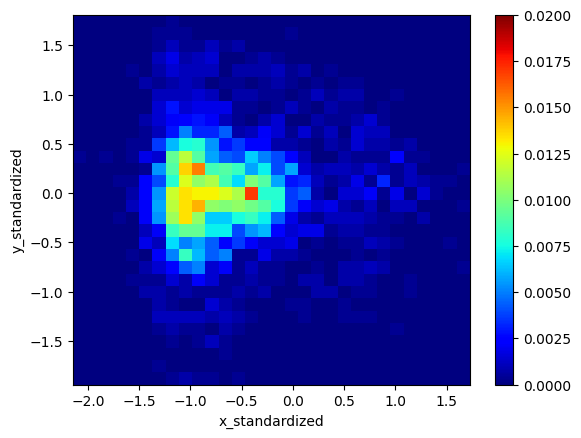

<Figure size 640x480 with 0 Axes>

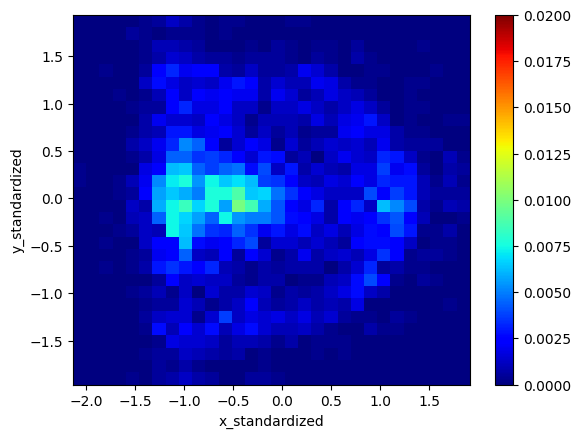

<Figure size 640x480 with 0 Axes>

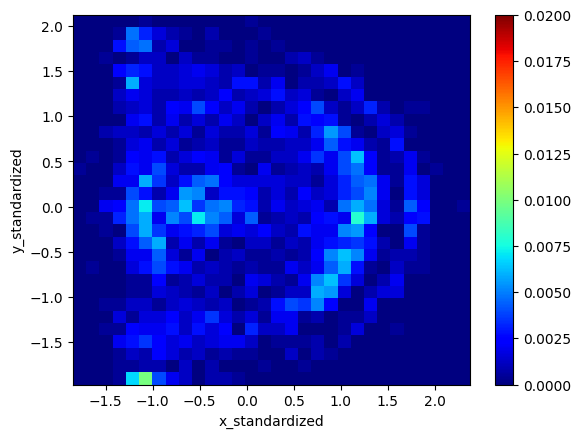

<Figure size 640x480 with 0 Axes>

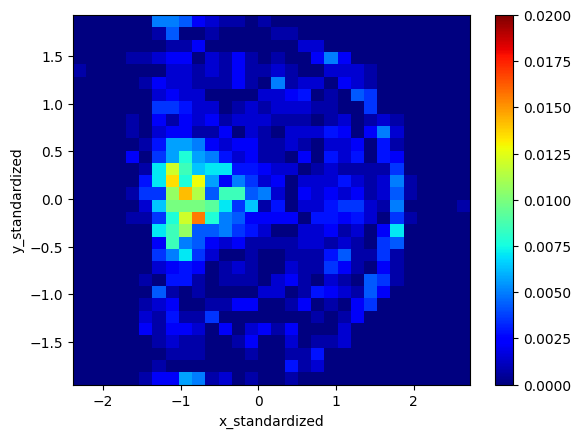

<Figure size 640x480 with 0 Axes>

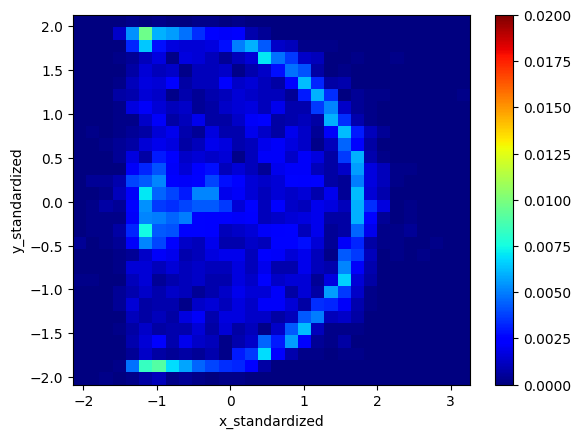

<Figure size 640x480 with 0 Axes>

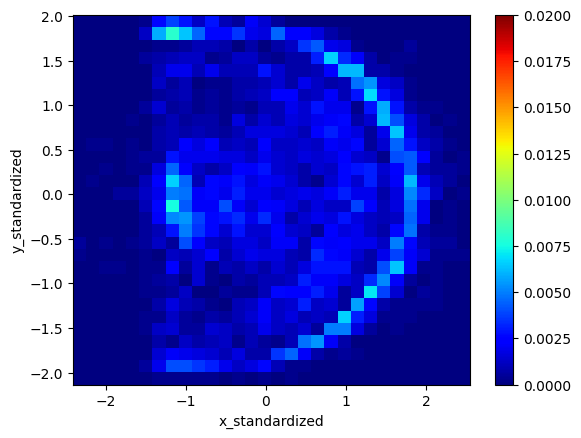

<Figure size 640x480 with 0 Axes>

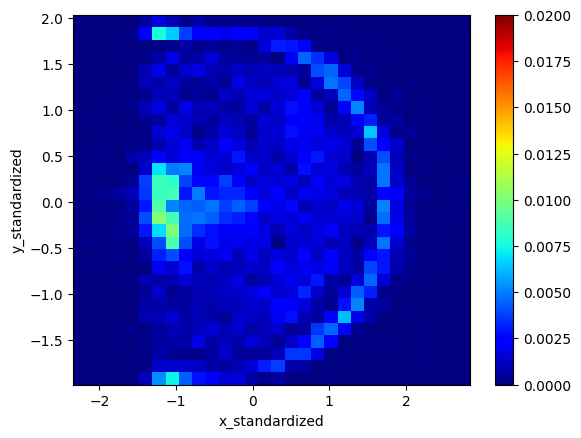

<Figure size 640x480 with 0 Axes>

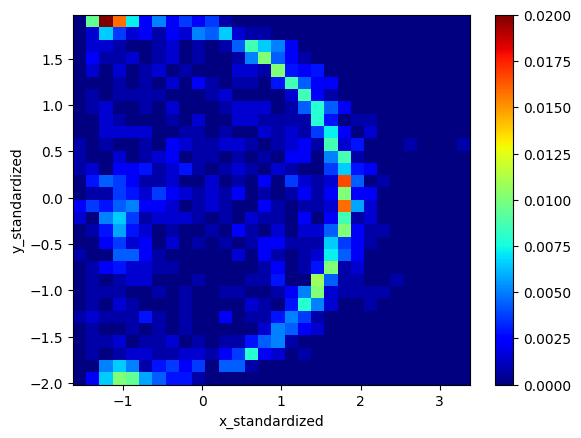

<Figure size 640x480 with 0 Axes>

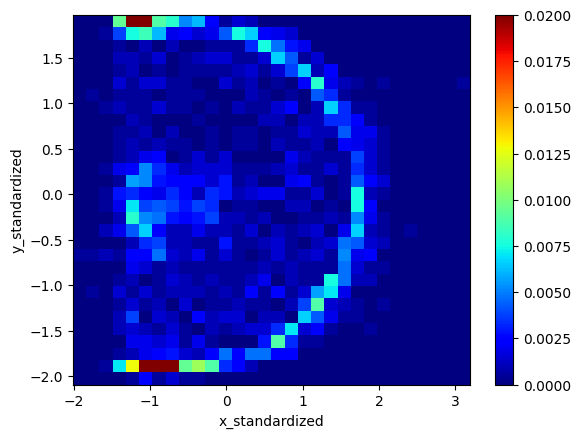

<Figure size 640x480 with 0 Axes>

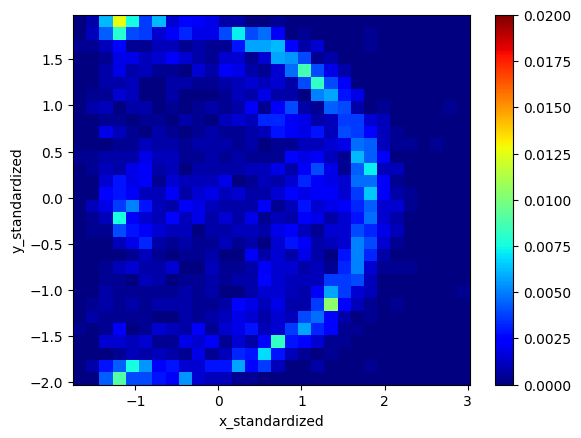

<Figure size 640x480 with 0 Axes>

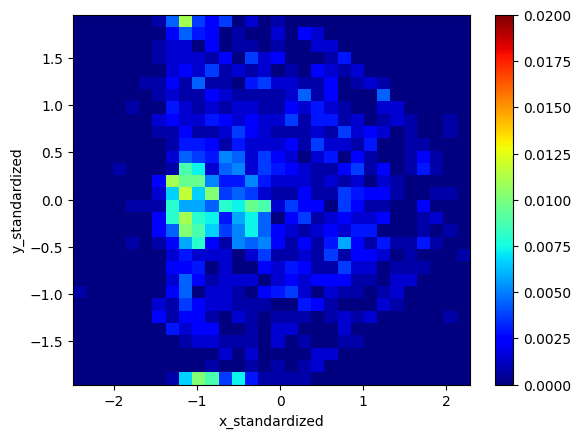

<Figure size 640x480 with 0 Axes>

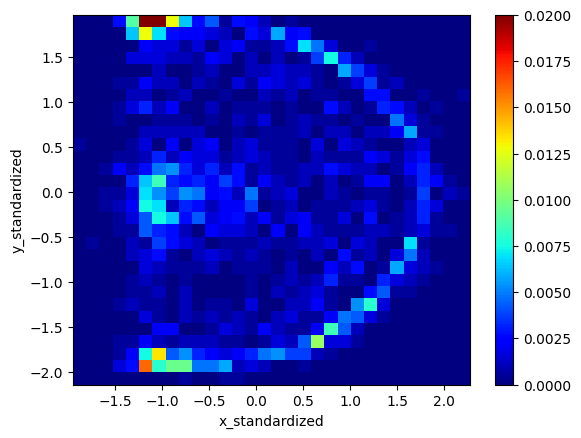

<Figure size 640x480 with 0 Axes>

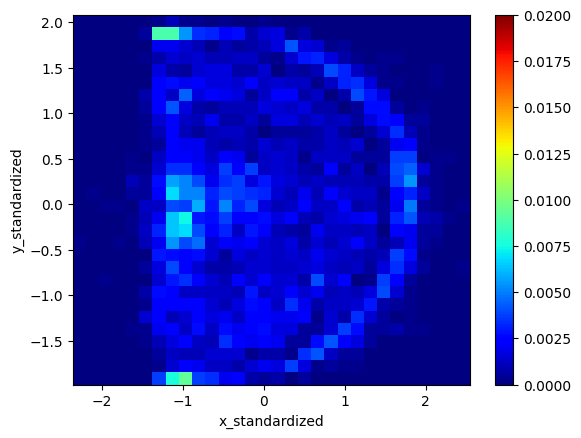

<Figure size 640x480 with 0 Axes>

In [95]:
for i in range(13):          
    n_cluster = i+1
    fig = plt.figure()
    ax = fig.add_subplot(111)

    H = ax.hist2d(shots_by_cluster[n_cluster]["shot_x"],
                  shots_by_cluster[n_cluster]["shot_y"], 
                  bins=30, cmap=cm.jet, 
                  weights=np.ones(len(shots_by_cluster[n_cluster]['shot_x'])) / len(shots_by_cluster[n_cluster]['shot_x']))
    ax.set_xlabel('x_standardized')
    ax.set_ylabel('y_standardized')
    H[3].set_clim(0, 0.02)
    fig.colorbar(H[3],ax=ax)
    plt.show()
    plt.clf()

In [96]:
# Visualization by t-SNE

colors = ['red', 'blue', 'green', 'orange', 'gray', 'cyan', 'brown', 'purple', 'pink', 'navy', 'magenta', 'olive', 'black']
cluster_name =["Close-range Big", "Mid-range Big", "Mid-range All-rounder", "Mid-range Slasher", "Outside All-rounder", "Pull-up Ball-Handler", "Drive Ball-Handler", "Stretch Four", "Corner Shooter", "Pure Shooter", "Outside Slasher", "Drive Shooter", "Stertch All-rounder"]

In [97]:
tsne = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=120, metric="precomputed", random_state=18)
tsne_result = tsne.fit_transform(distance_matrix)

In [98]:
tsne_by_cluster = {}
for k in range(13):
    n_cluster = k+1
    tsne_x = []
    tsne_y = []
    for i, tsne in enumerate(tsne_result):
        if clustering_result[i] == n_cluster:
            tsne_x.append(tsne[0])
            tsne_y.append(tsne[1])
    tsne_by_cluster[n_cluster] = (tsne_x, tsne_y)
tsne_by_cluster[13]

([-0.9716564,
  -2.005883,
  -1.8035355,
  -1.222709,
  -0.74317,
  -0.6082377,
  -1.4876608,
  -1.8249831,
  -1.3399374,
  -1.1927425,
  -1.404518,
  0.29144162,
  -0.16816497,
  0.62555397,
  0.3819563,
  -0.49271202,
  -1.0011724,
  -1.9368132,
  0.24934539,
  -0.1304908,
  -1.6331881,
  -1.117875,
  -1.7864617,
  0.04779615,
  -2.0680928],
 [0.27336767,
  0.67210567,
  1.3073446,
  0.9693473,
  0.101237774,
  0.7233731,
  1.1423739,
  0.6013511,
  1.6407433,
  0.4690097,
  0.3046494,
  0.082277775,
  0.13362294,
  0.2911435,
  0.31253612,
  0.556173,
  0.7136158,
  0.98586744,
  0.57962453,
  1.0136,
  1.1442333,
  0.95175356,
  1.5869201,
  -0.5750194,
  1.1749228])

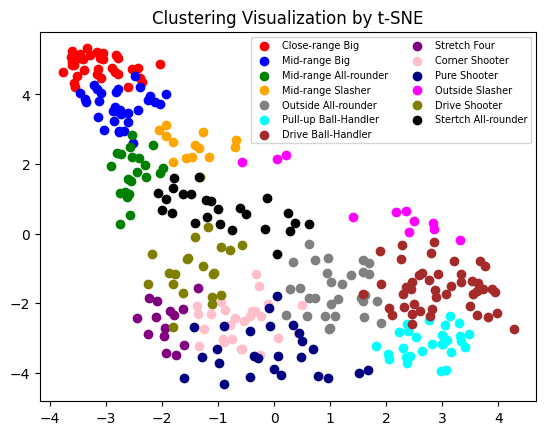

In [99]:
for k in range(13):
    n_cluster = k+1
    plt.scatter(tsne_by_cluster[n_cluster][0], tsne_by_cluster[n_cluster][1], color = colors[k], label=cluster_name[k])
    plt.title('Clustering Visualization by t-SNE')
plt.legend(ncol=2, fontsize=7)

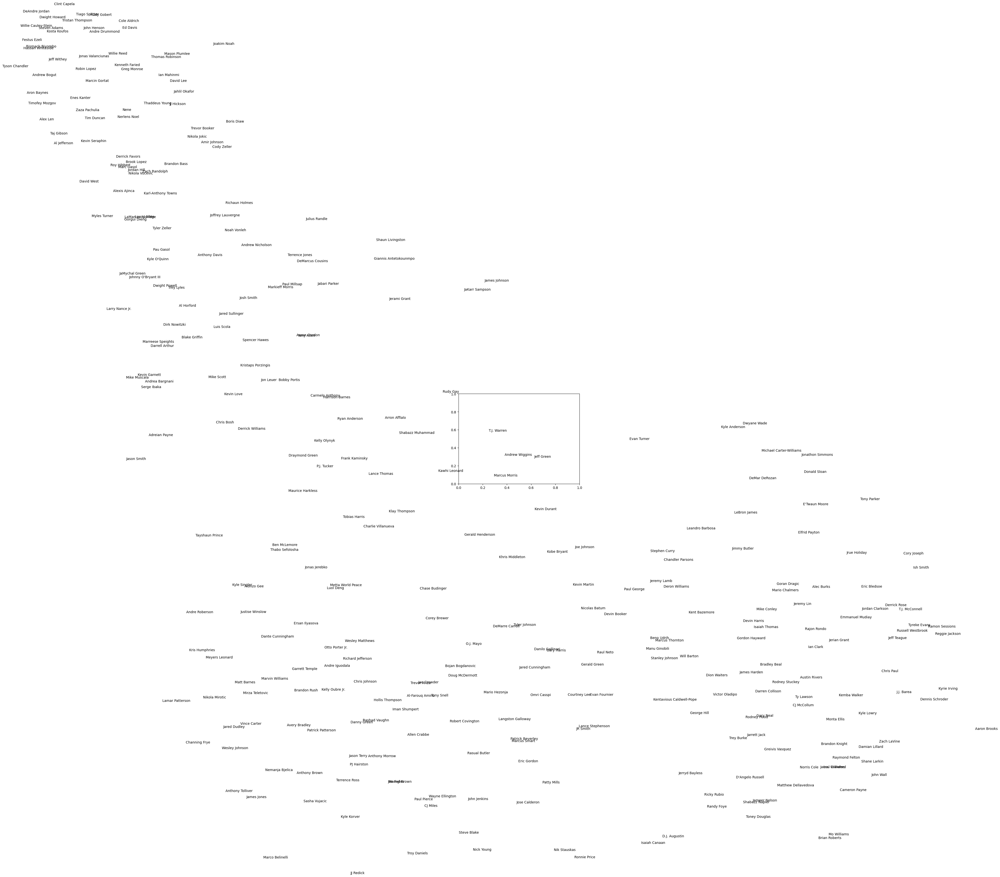

In [100]:
for (x, y), l in zip(tsne_result, player_30):
    plt.text(x, y, l)
    